### **Project Name**    -  **Spotify Tracks Dataset Clustering**



#GitHub Link-**https://github.com/eyespydushyant/spotify-songs-clustering**

# **Project Summary -**

Write the summary here within 500-600 words.

This project focuses on clustering Spotify songs based on their audio characteristics using K-Means Clustering, an unsupervised machine learning algorithm. The primary objective of the project is to discover hidden patterns within the Spotify Songs dataset by grouping songs that share similar musical features. Unlike supervised learning, clustering does not require predefined labels; instead, it identifies natural groupings in the data based on feature similarity. Such clustering can be useful for music recommendation systems, playlist generation, listener preference analysis, and understanding different styles of music.

The project began with a detailed understanding of the Spotify Songs dataset, which contains information about thousands of songs and their corresponding audio features. The dataset includes attributes such as danceability, energy, loudness, speechiness, acousticness, instrumentalness, liveness, valence, tempo, popularity, duration, explicit content, artists, album name, and track genre. Before applying any machine learning algorithm, the dataset underwent a preprocessing stage where missing values, duplicate records, and unnecessary columns were identified and handled appropriately. This ensured that the dataset was clean, consistent, and suitable for clustering.

After preprocessing, Exploratory Data Analysis (EDA) was performed to better understand the characteristics of the dataset. Various visualizations, including histograms, box plots, pie charts, count plots, heatmaps, correlation matrices, word clouds, and scatter plots, were created to analyze the distribution of features and identify relationships among variables. These visualizations provided valuable insights into song popularity, genre distribution, energy levels, danceability, and other musical characteristics present in the dataset.

Since the dataset contains numerical features with different scales, StandardScaler was applied to normalize the data before clustering. Feature scaling is an essential step because K-Means clustering relies on distance calculations, and unscaled data may produce biased results. The optimal number of clusters was determined using the Elbow Method and supported by the Silhouette Score. Although a smaller number of clusters produced a slightly higher Silhouette Score, K = 7 was selected because it provided a more meaningful segmentation of songs while maintaining good clustering quality and interpretability.

The K-Means algorithm was then trained on the scaled dataset, and each song was assigned to one of the seven clusters. To visualize these high-dimensional clusters, Principal Component Analysis (PCA) was applied to reduce the dataset to two dimensions. The PCA scatter plot clearly illustrated the separation of clusters and confirmed that the algorithm successfully grouped songs with similar audio characteristics. In addition, cluster distribution plots, heatmaps, and artist word clouds were generated to interpret each cluster and understand its dominant musical properties.

Finally, the results demonstrated that K-Means clustering effectively grouped songs into meaningful categories based on their audio features. These clusters can be used to build music recommendation systems, generate personalized playlists, analyze listener preferences, and discover similar songs automatically. The project highlights the practical application of unsupervised machine learning in the music industry and shows how clustering techniques can uncover valuable insights from large datasets. Overall, the project successfully achieved its objective of organizing Spotify songs into meaningful clusters, providing a strong foundation for future enhancements such as recommendation engines, genre prediction, and advanced music analytics.


# **Problem Statement**

Spotify contains millions of songs with different musical characteristics such as danceability, energy, loudness, tempo, popularity, acousticness, valence, and speechiness. Since there are no predefined labels indicating song categories, it becomes difficult to group songs with similar musical properties.

The objective of this project is to apply Unsupervised Machine Learning (Clustering) techniques to identify natural groups of songs based on their audio features. These clusters can help music streaming platforms improve recommendation systems, playlist generation, and user experience.

## <b>In this  project, you are required to do </b>
The goal of this project is to segment Spotify songs into meaningful clusters using machine learning algorithms.

The clustering results can help:

Build personalized music recommendations
Generate playlists automatically
Understand different music styles
Analyze similarities among songs
Improve user listening experience

# **Attribute Information**

| Attribute            | Description                                                                                    |
| -------------------- | ---------------------------------------------------------------------------------------------- |
| **track_id**         | Unique identifier assigned to each Spotify track.                                              |
| **track_name**       | Name of the song.                                                                              |
| **artists**          | Name of the artist(s) who performed the song.                                                  |
| **album_name**       | Name of the album containing the song.                                                         |
| **track_genre**      | Genre of the song.                                                                             |
| **popularity**       | Popularity score of the song ranging from 0 to 100. Higher values indicate greater popularity. |
| **duration_ms**      | Duration of the song in milliseconds.                                                          |
| **explicit**         | Indicates whether the song contains explicit content (True/False).                             |
| **danceability**     | Measures how suitable a song is for dancing. Values range from 0 to 1.                         |
| **energy**           | Represents the intensity and activity level of a song. Values range from 0 to 1.               |
| **key**              | Estimated musical key of the song.                                                             |
| **loudness**         | Overall loudness of the song measured in decibels (dB).                                        |
| **mode**             | Indicates whether the song is in Major (1) or Minor (0) mode.                                  |
| **speechiness**      | Measures the presence of spoken words in a song.                                               |
| **acousticness**     | Confidence measure of whether the song is acoustic. Values range from 0 to 1.                  |
| **instrumentalness** | Predicts whether a song contains no vocals. Values closer to 1 indicate instrumental tracks.   |
| **liveness**         | Detects the presence of a live audience during the recording.                                  |
| **valence**          | Describes the musical positivity of the song. Higher values indicate happier songs.            |
| **tempo**            | Estimated tempo of the song measured in Beats Per Minute (BPM).                                |
| **time_signature**   | Estimated number of beats in each musical measure.                                             |


# ***Let's Begin !***

## ***1. Know Your Data***





In [ ]:
!pip install wordcloud

### Import Libraries

In [ ]:
# import the dependancy
# Data Manipulation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN

from sklearn.decomposition import PCA

from sklearn.metrics import silhouette_score


from scipy.cluster.hierarchy import dendrogram, linkage
import warnings
warnings.filterwarnings('ignore')

### Dataset Loading

In [ ]:
# import the dataset
data = pd.read_csv('/content/dataset.csv')

### Dataset First View

In [ ]:
# print first five rows
data.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [ ]:
# print last five rows
data.tail()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
113995,113995,2C3TZjDRiAzdyViavDJ217,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Sleep My Little Boy,21,384999,False,0.172,0.235,...,-16.393,1,0.0422,0.640,0.928,0.0863,0.0339,125.995,5,world-music
113996,113996,1hIz5L4IB9hN3WRYPOCGPw,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Water Into Light,22,385000,False,0.174,0.117,...,-18.318,0,0.0401,0.994,0.976,0.1050,0.0350,85.239,4,world-music
113997,113997,6x8ZfSoqDjuNa5SVP5QjvX,Cesária Evora,Best Of,Miss Perfumado,22,271466,False,0.629,0.329,...,-10.895,0,0.0420,0.867,0.000,0.0839,0.7430,132.378,4,world-music
113998,113998,2e6sXL2bYv4bSz6VTdnfLs,Michael W. Smith,Change Your World,Friends,41,283893,False,0.587,0.506,...,-10.889,1,0.0297,0.381,0.000,0.2700,0.4130,135.960,4,world-music
113999,113999,2hETkH7cOfqmz3LqZDHZf5,Cesária Evora,Miss Perfumado,Barbincor,22,241826,False,0.526,0.487,...,-10.204,0,0.0725,0.681,0.000,0.0893,0.7080,79.198,4,world-music


### Dataset Rows & Columns count

In [ ]:
# Check the shape of the dataset
data.shape

(114000, 21)

### Data describe

In [ ]:
#To check distribution describing dataset
data.describe(include='all')

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
count,114000.000000,114000,113999,113999,113999,114000.000000,1.140000e+05,114000,114000.000000,114000.000000,...,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000
unique,NaN,89741,31437,46589,73608,NaN,NaN,2,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,114
top,NaN,6S3JlDAGk3uu3NtZbPnuhS,The Beatles,Alternative Christmas 2022,Run Rudolph Run,NaN,NaN,False,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,acoustic
freq,NaN,9,279,195,151,NaN,NaN,104253,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1000
mean,56999.500000,NaN,NaN,NaN,NaN,33.238535,2.280292e+05,NaN,0.566800,0.641383,...,-8.258960,0.637553,0.084652,0.314910,0.156050,0.213553,0.474068,122.147837,3.904035,NaN
std,32909.109681,NaN,NaN,NaN,NaN,22.305078,1.072977e+05,NaN,0.173542,0.251529,...,5.029337,0.480709,0.105732,0.332523,0.309555,0.190378,0.259261,29.978197,0.432621,NaN
min,0.000000,NaN,NaN,NaN,NaN,0.000000,0.000000e+00,NaN,0.000000,0.000000,...,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
25%,28499.750000,NaN,NaN,NaN,NaN,17.000000,1.740660e+05,NaN,0.456000,0.472000,...,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218750,4.000000,NaN
50%,56999.500000,NaN,NaN,NaN,NaN,35.000000,2.129060e+05,NaN,0.580000,0.685000,...,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000,NaN
75%,85499.250000,NaN,NaN,NaN,NaN,50.000000,2.615060e+05,NaN,0.695000,0.854000,...,-5.003000,1.000000,0.084500,0.598000,0.049000,0.273000,0.683000,140.071000,4.000000,NaN


In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,114000.0,56999.500000,32909.109681,0.000,28499.75000,56999.500000,85499.2500,113999.000
popularity,114000.0,33.238535,22.305078,0.000,17.00000,35.000000,50.0000,100.000
duration_ms,114000.0,228029.153114,107297.712645,0.000,174066.00000,212906.000000,261506.0000,5237295.000
danceability,114000.0,0.566800,0.173542,0.000,0.45600,0.580000,0.6950,0.985
energy,114000.0,0.641383,0.251529,0.000,0.47200,0.685000,0.8540,1.000
key,114000.0,5.309140,3.559987,0.000,2.00000,5.000000,8.0000,11.000
loudness,114000.0,-8.258960,5.029337,-49.531,-10.01300,-7.004000,-5.0030,4.532
mode,114000.0,0.637553,0.480709,0.000,0.00000,1.000000,1.0000,1.000
speechiness,114000.0,0.084652,0.105732,0.000,0.03590,0.048900,0.0845,0.965
acousticness,114000.0,0.314910,0.332523,0.000,0.01690,0.169000,0.5980,0.996


## **2. Data Wrangling**

In [ ]:
# print the info of the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 non-null  object 
 3   album_name        113999 non-null  object 
 4   track_name        113999 non-null  object 
 5   popularity        114000 non-null  int64  
 6   duration_ms       114000 non-null  int64  
 7   explicit          114000 non-null  bool   
 8   danceability      114000 non-null  float64
 9   energy            114000 non-null  float64
 10  key               114000 non-null  int64  
 11  loudness          114000 non-null  float64
 12  mode              114000 non-null  int64  
 13  speechiness       114000 non-null  float64
 14  acousticness      114000 non-null  float64
 15  instrumentalness  114000 non-null  float64
 16  liveness          11

In [ ]:
data.isnull().sum()

,0
Unnamed: 0,0
track_id,0
artists,1
album_name,1
track_name,1
popularity,0
duration_ms,0
explicit,0
danceability,0
energy,0


* We have **114000** **rows** and **21** **columns** provided in the data.




#### Missing Values/Null Values

In [ ]:
# Check for null values %.
for col in data.columns:
  null_rate = data[col].isnull().sum() / len(data) * 100
  if null_rate > 0:
    print(f'The null values in {col} column are  {data[col].isnull().sum()} Percentage:- {null_rate}%')

The null values in artists column are  1 Percentage:- 0.0008771929824561403%
The null values in album_name column are  1 Percentage:- 0.0008771929824561403%
The null values in track_name column are  1 Percentage:- 0.0008771929824561403%


<Axes: >

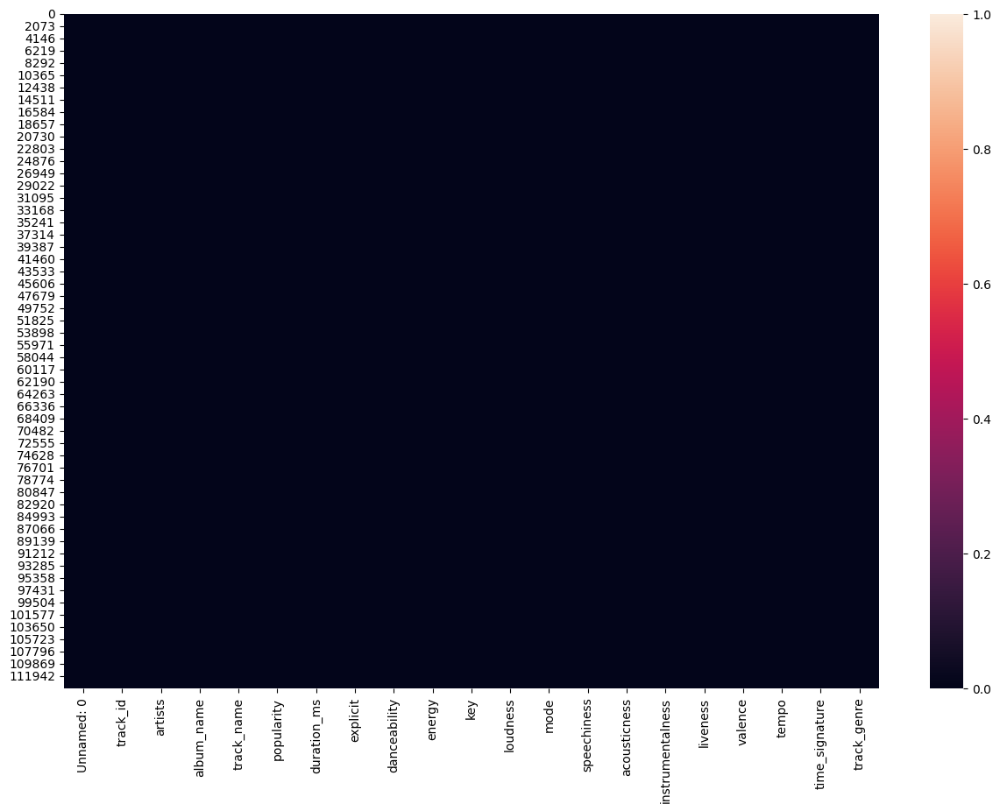

In [ ]:
# let's visualizing  the null values
plt.figure(figsize=(15,10))
sns.heatmap(data.isna())

#### Null value treatment

In [ ]:
num_cols = data.select_dtypes(include=np.number).columns

for col in num_cols:
    data[col].fillna(data[col].median(), inplace=True)

In [ ]:
cat_cols = data.select_dtypes(include='object').columns

for col in cat_cols:
    data[col].fillna(data[col].mode()[0], inplace=True)

In [ ]:
#Check null values
data.isnull().sum()

,0
Unnamed: 0,0
track_id,0
artists,0
album_name,0
track_name,0
popularity,0
duration_ms,0
explicit,0
danceability,0
energy,0


#### Duplicate Values

In [ ]:
data.duplicated().sum()

np.int64(0)

In [ ]:
data.drop_duplicates(inplace=True)

In [ ]:
data.shape

(114000, 21)

In [ ]:
data.columns

Index(['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name',
       'popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre'],
      dtype='object')

In [ ]:
drop_columns = ['Unnamed: 0','id','track_id','uri']

for col in drop_columns:
    if col in data.columns:
        data.drop(col, axis=1, inplace=True)

In [ ]:
data.isnull().sum().sum()

np.int64(0)

In [ ]:
data.head()

,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [ ]:
num_features = data.select_dtypes(include=np.number)

cat_features = data.select_dtypes(include='object')

In [ ]:
num_features.columns

Index(['popularity', 'duration_ms', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'time_signature'],
      dtype='object')

In [ ]:
cat_features.columns

Index(['artists', 'album_name', 'track_name', 'track_genre'], dtype='object')

In [ ]:
print("Number of Rows :", data.shape[0])

print("Number of Columns :", data.shape[1])

print("Numerical Columns :", len(num_features.columns))

print("Categorical Columns :", len(cat_features.columns))

Number of Rows : 114000
Number of Columns : 19
Numerical Columns : 14
Categorical Columns : 4


## What did you know about your dataset?

### **1- Data Overview**

* We have approximately **114000 rows** and **19 columns** (may vary slightly depending on the dataset version) provided in the dataset.

* The dataset contains both **numerical** and **categorical** columns describing the audio characteristics and metadata of Spotify songs.

* Each row represents a unique Spotify song, while each column represents a different feature of that song.

* Since this is an **Unsupervised Machine Learning** problem, the dataset **does not contain any target variable**.

---

### **2- Checking the Missing Values**

* First, we check the dataset for missing values using the `isnull().sum()` function.

* If numerical columns contain missing values, they can be replaced using the **median** of the respective column.

* If categorical columns contain missing values, they can be replaced using the **mode (most frequent value)**.

* After handling missing values, the dataset becomes suitable for further analysis.

---

### **3- Checking Duplicate Values in the Dataset**

* We check whether duplicate records are present using the `duplicated()` function.

* If duplicate songs are found, they are removed to improve clustering performance and avoid redundant observations.

---

### **4- Understanding the Features**

* The dataset contains important audio features such as **danceability, energy, loudness, speechiness, acousticness, instrumentalness, liveness, valence, tempo,** and **duration**.

* It also contains metadata like **track name, artist name, album name, genre, popularity,** and **explicit content**.

* These features help us understand the musical characteristics of songs and are useful for grouping similar songs together.

---

### **5- Data Types**

* The dataset contains both **numerical** and **categorical** variables.

* Numerical variables will be used for clustering because they represent measurable audio characteristics.

* Categorical variables are mainly useful for understanding and interpreting the clusters after model building.

---

### **6- Feature Scaling**

* The numerical features have different ranges and units.

* For example, **tempo** is measured in BPM, **loudness** is measured in decibels, while **danceability** and **energy** range from **0 to 1**.

* Therefore, feature scaling using **StandardScaler** is necessary before applying clustering algorithms.

---

### **7- Overall Observation**

* The Spotify Songs dataset is rich in audio features and is well suited for clustering analysis.

* The dataset provides sufficient information to identify groups of songs with similar musical characteristics.

* These clusters can be useful for **music recommendation systems**, **playlist generation**, **song similarity analysis**, and **understanding listener preferences**.

## ***3. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

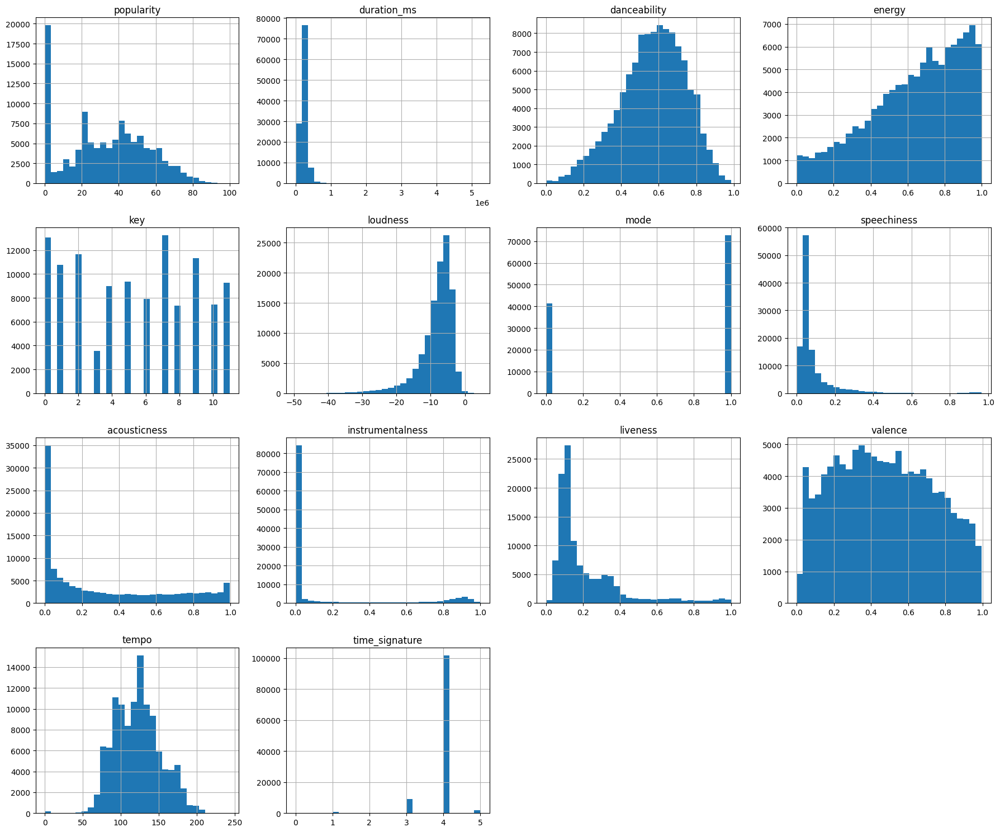

In [ ]:
data.hist(figsize=(18,15), bins=30)

plt.tight_layout()

plt.show()

What do you observe?

Most numerical features have different distributions.
Some features are normally distributed, while others are highly skewed.
This indicates that feature scaling will be necessary before clustering.


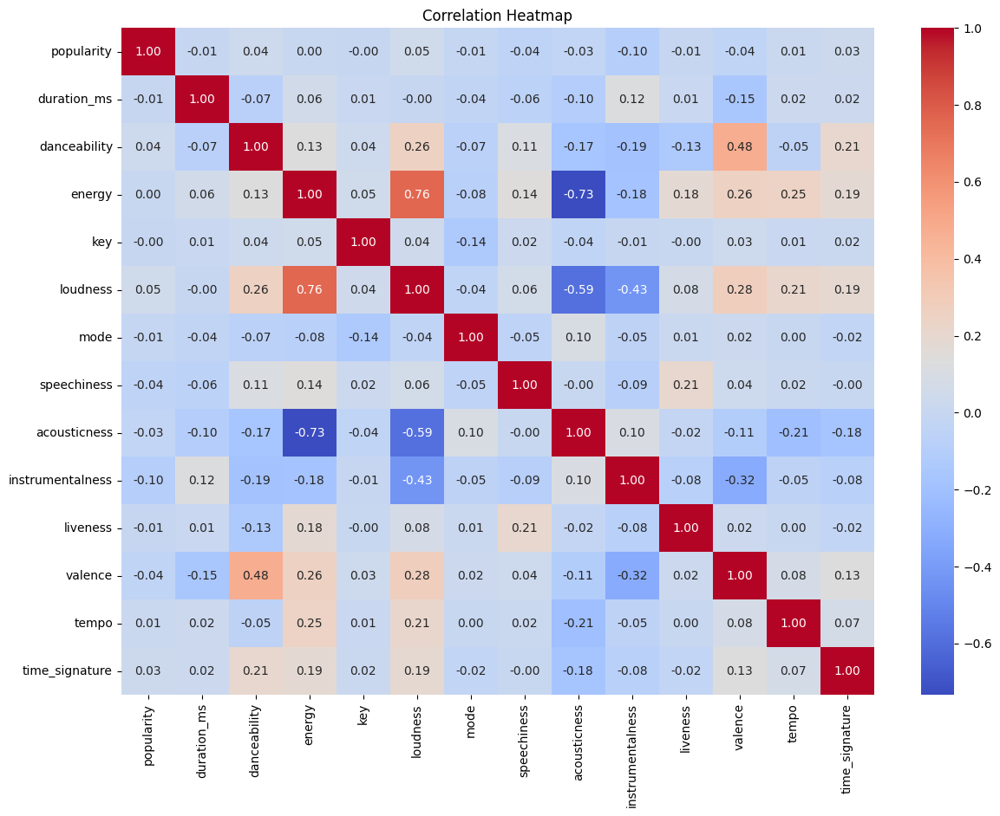

In [ ]:
plt.figure(figsize=(14,10))

sns.heatmap(data.select_dtypes(include=np.number).corr(),
            annot=True,
            cmap='coolwarm',
            fmt=".2f")

plt.title("Correlation Heatmap")

plt.show()

Observation

1.Energy and Loudness are positively correlated.

2.Acousticness is negatively correlated with Energy.

3.Danceability shows a moderate relationship with Valence.

4.Most features are not highly correlated, which is beneficial for clustering.

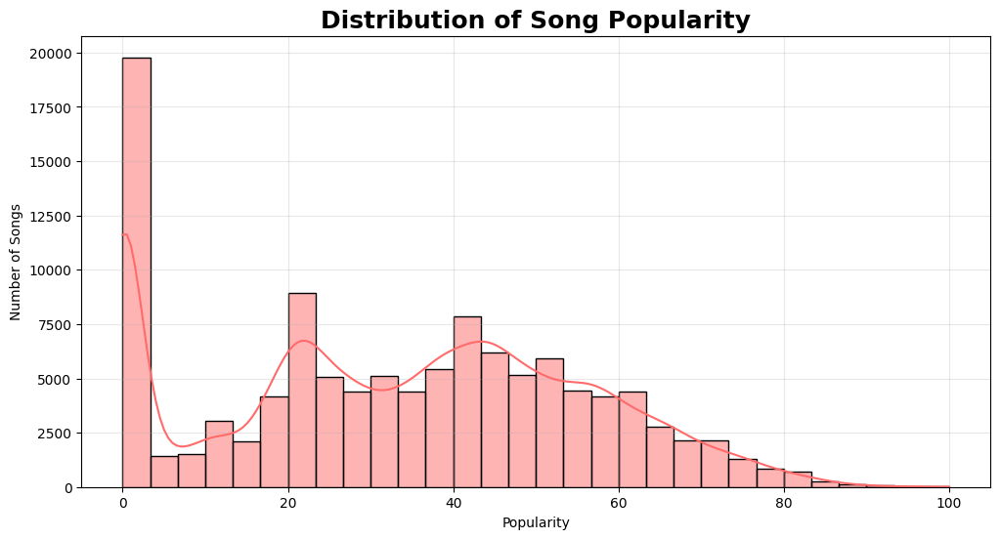

In [ ]:
plt.figure(figsize=(12,6))

sns.histplot(data['popularity'],
             bins=30,
             kde=True,
             color='#FF6B6B',
             edgecolor='black')

plt.title('Distribution of Song Popularity',fontsize=18,fontweight='bold')
plt.xlabel('Popularity')
plt.ylabel('Number of Songs')

plt.grid(alpha=0.3)

plt.show()

Observation

1.Most songs have medium popularity.

2.Only a small number of songs have very high popularity.

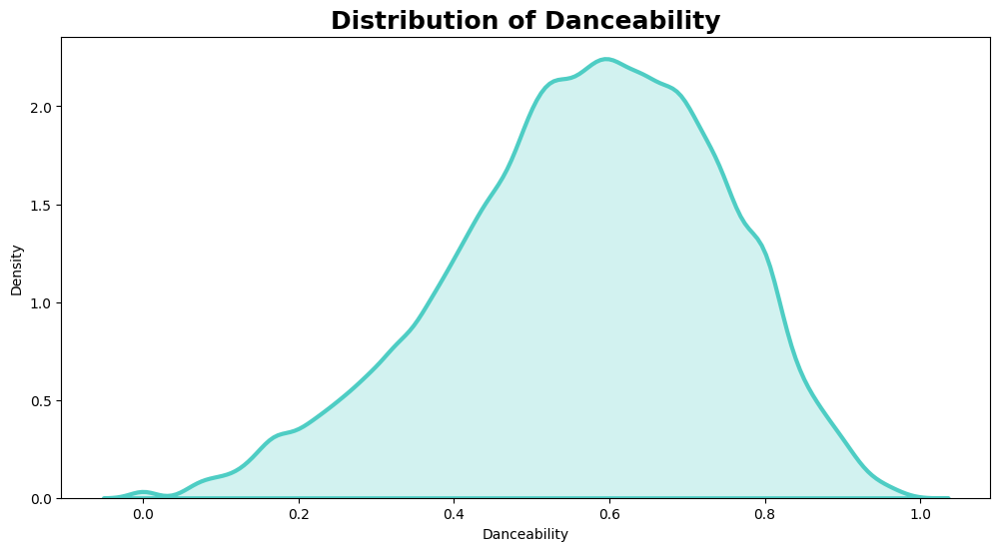

In [ ]:
plt.figure(figsize=(12,6))

sns.kdeplot(data['danceability'],
            shade=True,
            color='#4ECDC4',
            linewidth=3)

plt.title("Distribution of Danceability",fontsize=18,fontweight='bold')

plt.xlabel("Danceability")

plt.show()

Observation:-



* Most songs are moderately to highly danceable

* Extremely low danceability songs are uncommon













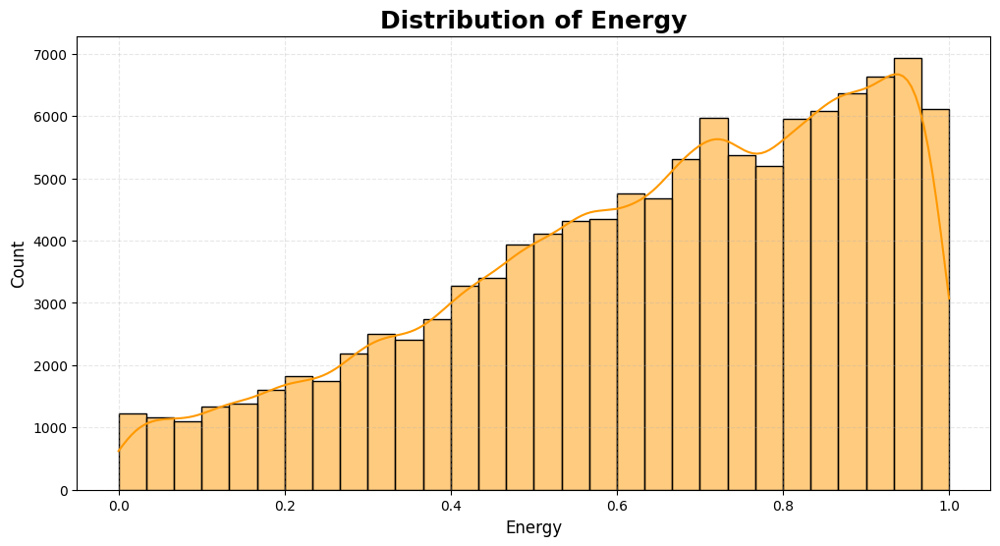

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))

autumn_color = plt.cm.autumn(0.6)

sns.histplot(
    data['energy'],
    bins=30,
    color=autumn_color,
    edgecolor='black',
    kde=True
)

plt.title("Distribution of Energy", fontsize=18, fontweight='bold')
plt.xlabel("Energy", fontsize=12)
plt.ylabel("Count", fontsize=12)

plt.grid(alpha=0.3, linestyle='--')

plt.show()

Observation:-


*  Spotify contains many energetic songs.
*  Low-energy songs occupy a smaller portion.



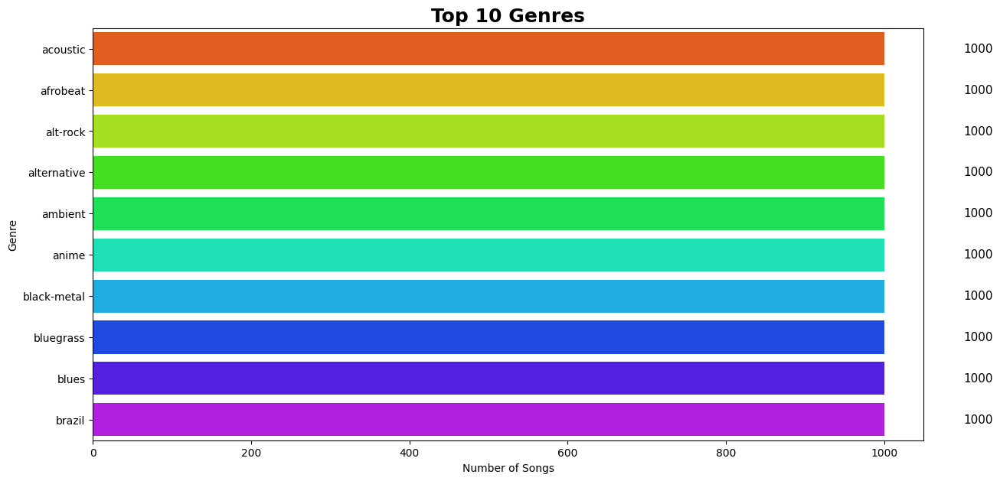

In [ ]:
plt.figure(figsize=(14,7))

genre=data['track_genre'].value_counts().head(10)

ax=sns.barplot(x=genre.values,
               y=genre.index,
               palette='gist_rainbow')

for i,v in enumerate(genre.values):
    ax.text(v+100,i,str(v),va='center',fontsize=11)

plt.title("Top 10 Genres",fontsize=18,fontweight='bold')

plt.xlabel("Number of Songs")

plt.ylabel("Genre")

plt.show()

Observation



*  The dataset contains songs from many genres
*  Some genres contribute significantly more songs than others.



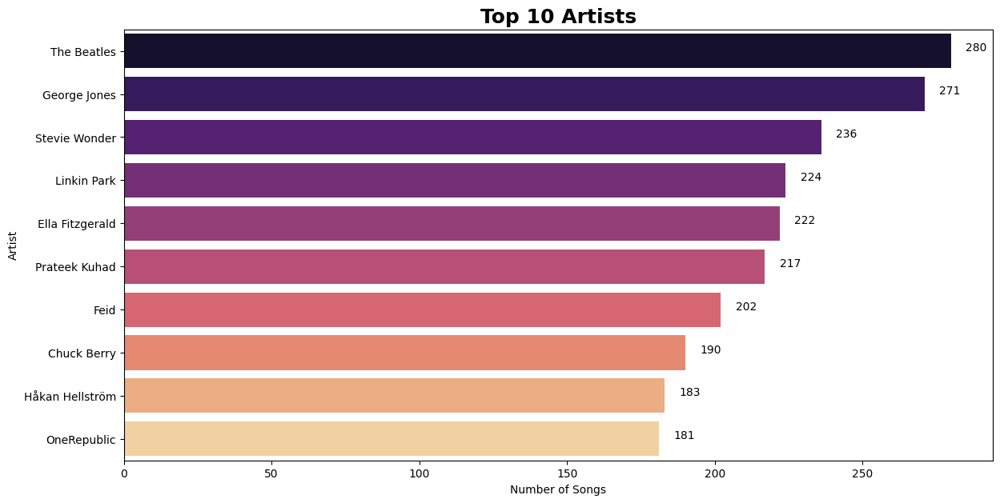

In [ ]:
plt.figure(figsize=(14,7))

artist=data['artists'].value_counts().head(10)

ax=sns.barplot(x=artist.values,
               y=artist.index,
               palette='magma')

for i,v in enumerate(artist.values):
    ax.text(v+5,i,str(v),fontsize=10)

plt.title("Top 10 Artists",fontsize=18,fontweight='bold')

plt.xlabel("Number of Songs")

plt.ylabel("Artist")

plt.show()

Observation


*  A few artists contribute a large number of songs
*  Most artists have relatively fewer songs.



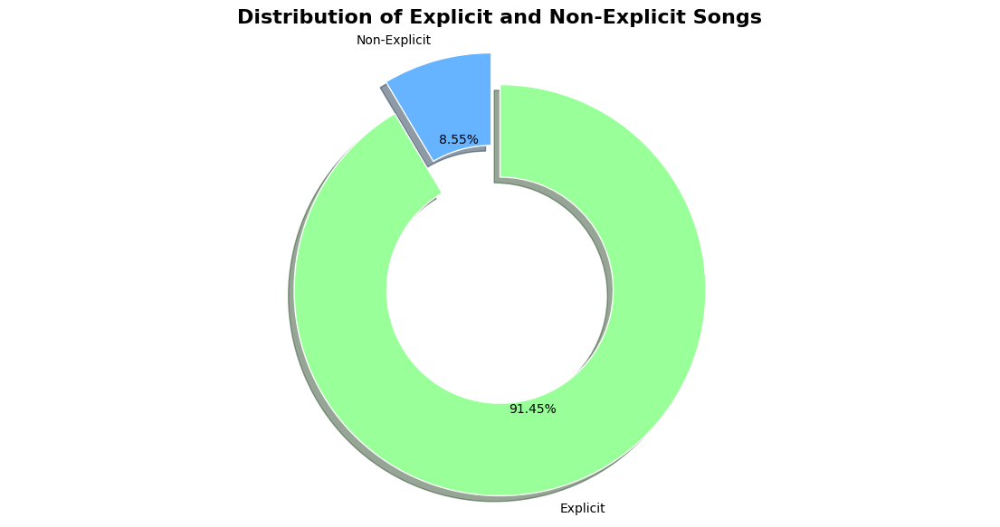

In [ ]:
plt.figure(figsize=(14,7))

colors = ['#66b3ff', '#99ff99']
content = ['Non-Explicit', 'Explicit']

plt.pie(
    data['explicit'].value_counts().sort_values(),
    labels=content,
    explode=[0.08, 0.08],
    autopct='%1.2f%%',
    startangle=90,
    shadow=True,
    colors=colors,
    wedgeprops=dict(width=0.45, edgecolor='white')
)

plt.title('Distribution of Explicit and Non-Explicit Songs',
          fontsize=16,
          fontweight='bold')

plt.axis('equal')
plt.show()

Observation


*   Most Spotify songs are non-explicit.
*   Explicit songs represent a smaller proportion



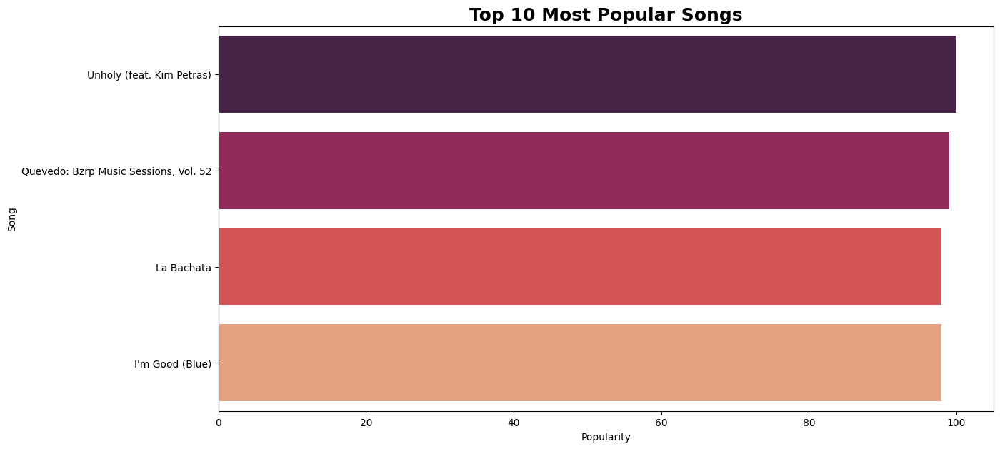

In [ ]:
popular=data.sort_values('popularity',
                       ascending=False).head(10)

plt.figure(figsize=(14,7))

sns.barplot(data=popular,
            x='popularity',
            y='track_name',
            palette='rocket')

plt.title("Top 10 Most Popular Songs",
          fontsize=18,
          fontweight='bold')

plt.xlabel("Popularity")

plt.ylabel("Song")

plt.show()

Observation


*   These songs have the highest popularity scores
*  They represent the most listened-to tracks in the dataset.



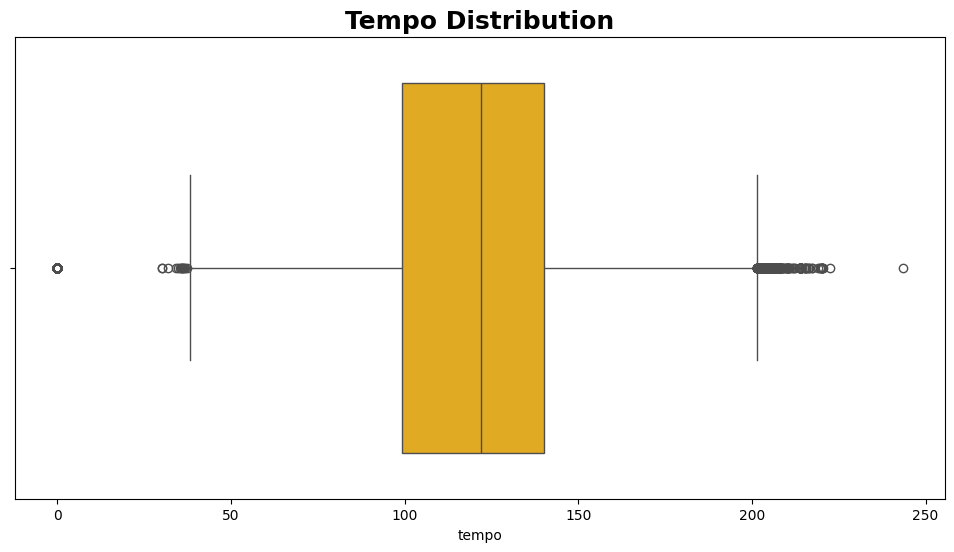

In [ ]:
plt.figure(figsize=(12,6))

sns.boxplot(x=data['tempo'],
            color='#FFB703')

plt.title("Tempo Distribution",
          fontsize=18,
          fontweight='bold')

plt.show()

Observation

*   Most songs have a tempo between approximately 90–150 BPM.
*   Some outliers represent unusually slow or fast songs



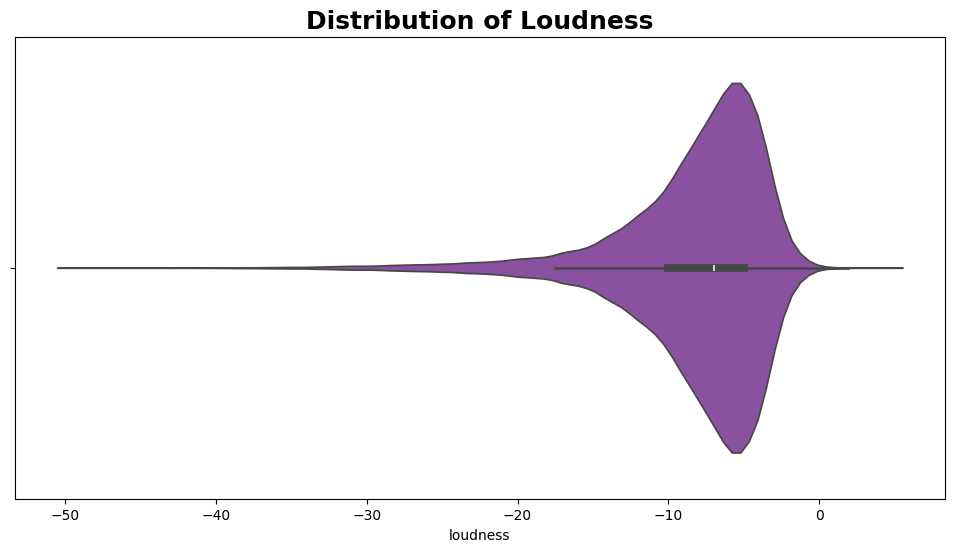

In [ ]:
plt.figure(figsize=(12,6))

sns.violinplot(x=data['loudness'],
               color='#8E44AD')

plt.title("Distribution of Loudness",
          fontsize=18,
          fontweight='bold')

plt.show()

Observation



*   Loudness values are concentrated within a specific range.
*   Only a few songs are extremely loud or quiet



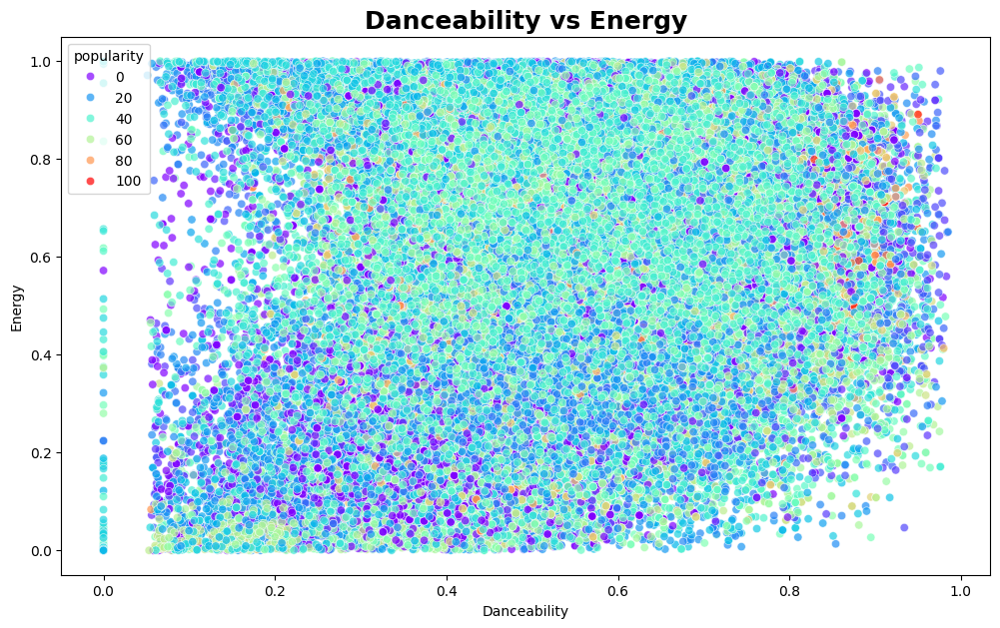

In [ ]:
plt.figure(figsize=(12,7))

sns.scatterplot(
    data=data,
    x='danceability',
    y='energy',
    hue='popularity',
    palette='rainbow',
    alpha=0.7
)

plt.title("Danceability vs Energy",
          fontsize=18,
          fontweight='bold')

plt.xlabel("Danceability")
plt.ylabel("Energy")

plt.show()

**Observation**


*  Songs with higher danceability generally have moderate to high energy
*  Popular songs are distributed across different energy levels.



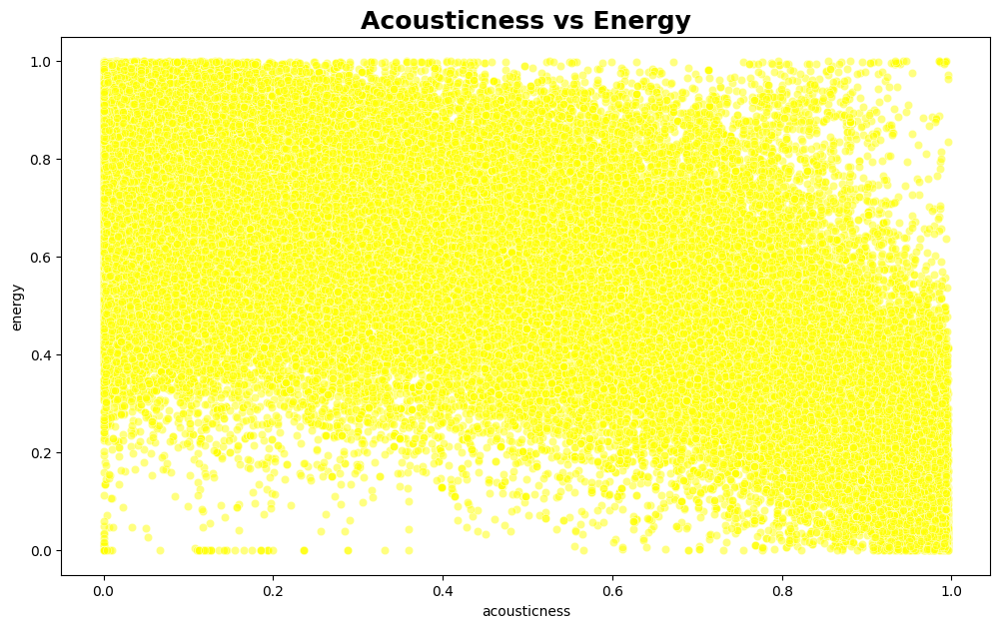

In [ ]:
plt.figure(figsize=(12,7))

sns.scatterplot(
    data=data,
    x='acousticness',
    y='energy',
    color='yellow',
    alpha=0.5
)

plt.title("Acousticness vs Energy",
          fontsize=18,
          fontweight='bold')

plt.show()

**Observation**


*  Songs with high acousticness usually have lower energy
*  A clear negative relationship exists.



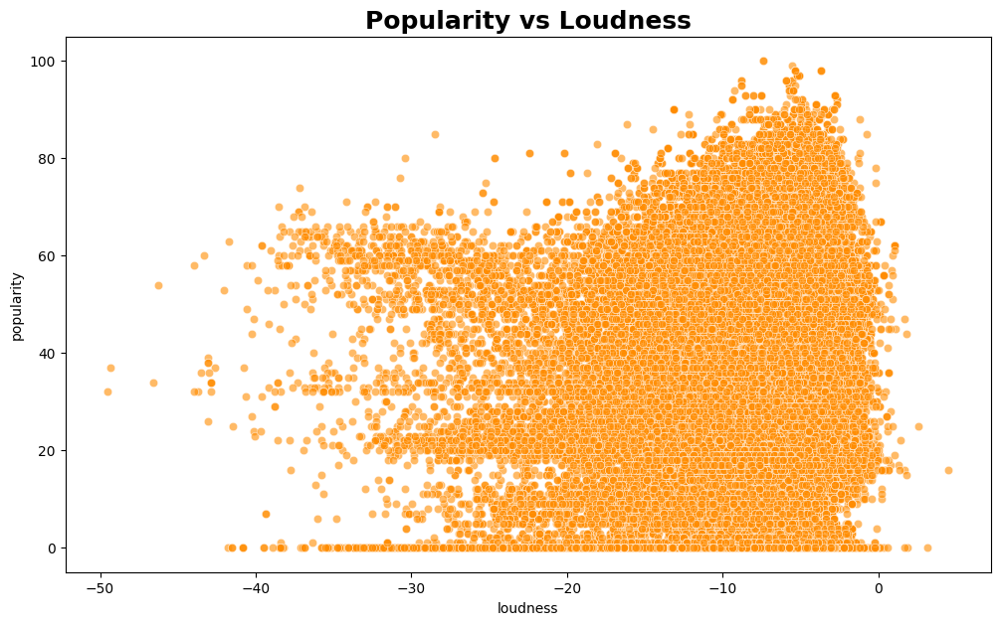

In [ ]:
plt.figure(figsize=(12,7))

sns.scatterplot(
    data=data,
    x='loudness',
    y='popularity',
    color='darkorange',
    alpha=0.6
)

plt.title("Popularity vs Loudness",
          fontsize=18,
          fontweight='bold')

plt.show()

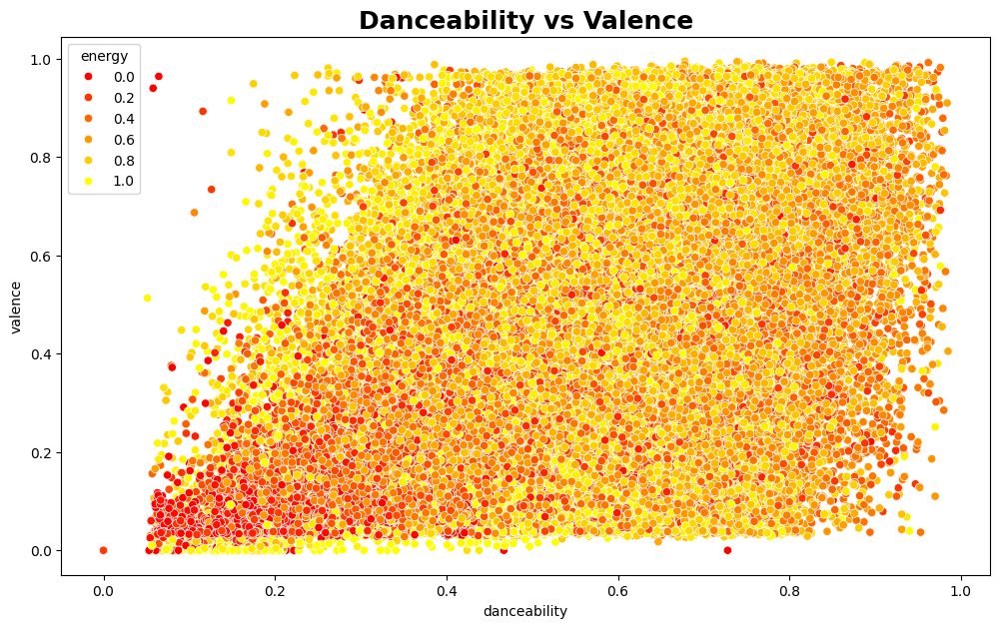

In [ ]:
plt.figure(figsize=(12,7))

sns.scatterplot(
    data=data,
    x='danceability',
    y='valence',
    hue='energy',
    palette='autumn'
)

plt.title("Danceability vs Valence",
          fontsize=18,
          fontweight='bold')

plt.show()

**Observation**


*   Happier songs (high valence) are often more danceable.
*   High-energy songs appear in most danceability ranges.



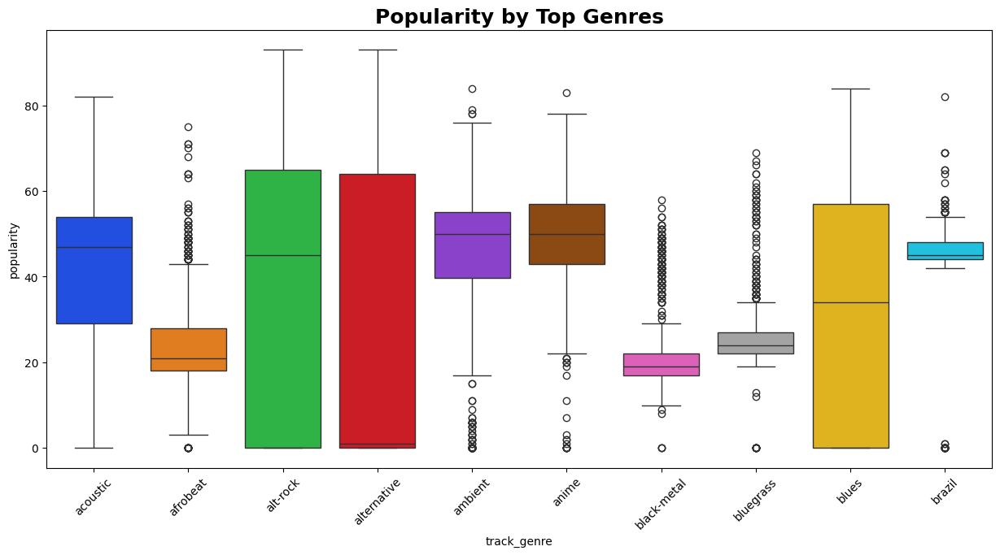

In [ ]:
top=data['track_genre'].value_counts().head(10).index

plt.figure(figsize=(15,7))

sns.boxplot(
    data=data[data['track_genre'].isin(top)],
    x='track_genre',
    y='popularity',
    palette='bright'
)

plt.xticks(rotation=45)

plt.title("Popularity by Top Genres",
          fontsize=18,
          fontweight='bold')

plt.show()

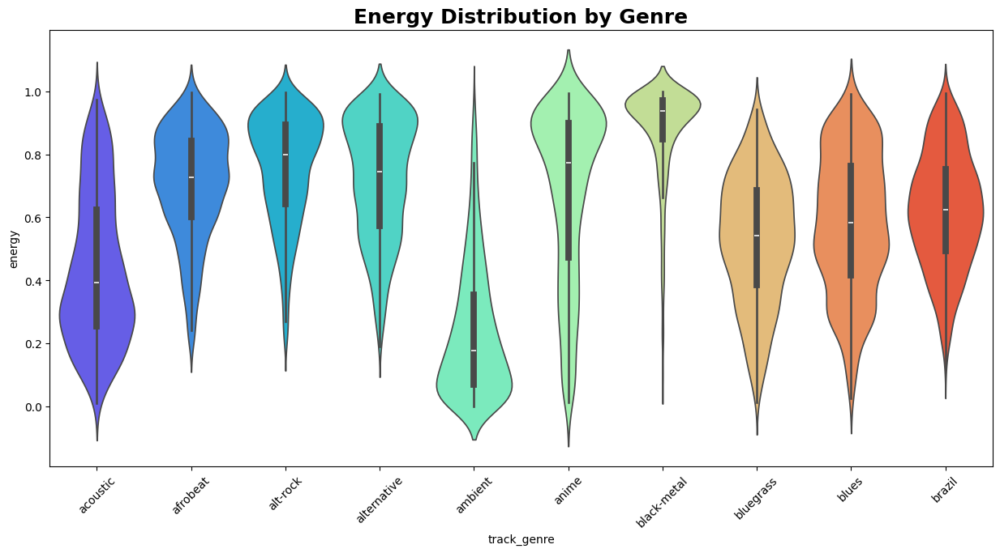

In [ ]:
plt.figure(figsize=(15,7))

sns.violinplot(
    data=data[data['track_genre'].isin(top)],
    x='track_genre',
    y='energy',
    palette='rainbow'
)

plt.xticks(rotation=45)

plt.title("Energy Distribution by Genre",
          fontsize=18,
          fontweight='bold')

plt.show()

**Observation**


1.   Certain genres have consistently energetic songs.
2.   Others show a wider variation in energy.



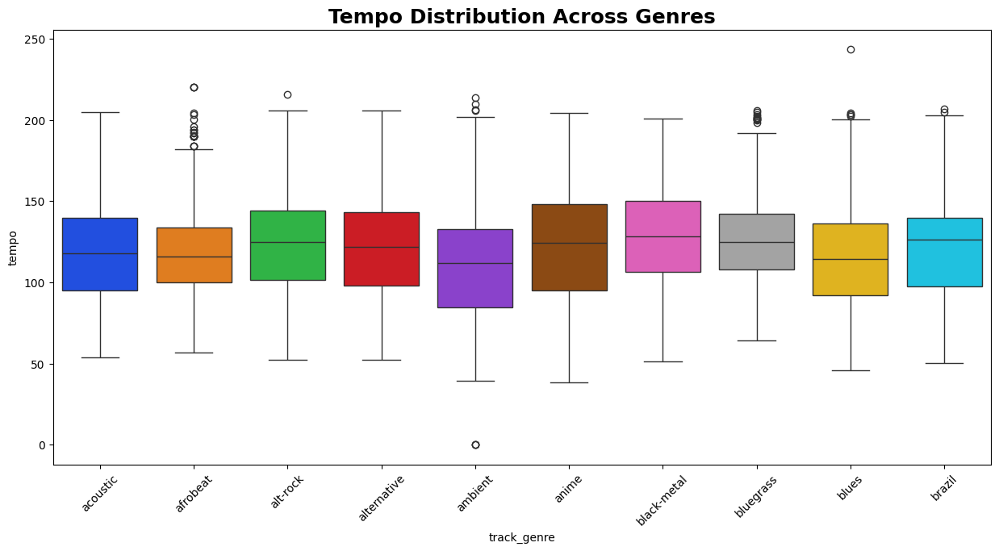

In [ ]:
plt.figure(figsize=(15,7))

sns.boxplot(
    data=data[data['track_genre'].isin(top)],
    x='track_genre',
    y='tempo',
    palette='bright'
)

plt.xticks(rotation=45)

plt.title("Tempo Distribution Across Genres",
          fontsize=18,
          fontweight='bold')

plt.show()

**Observation**


*  Tempo differs considerably between genres
*   Some genres have more variability than others.



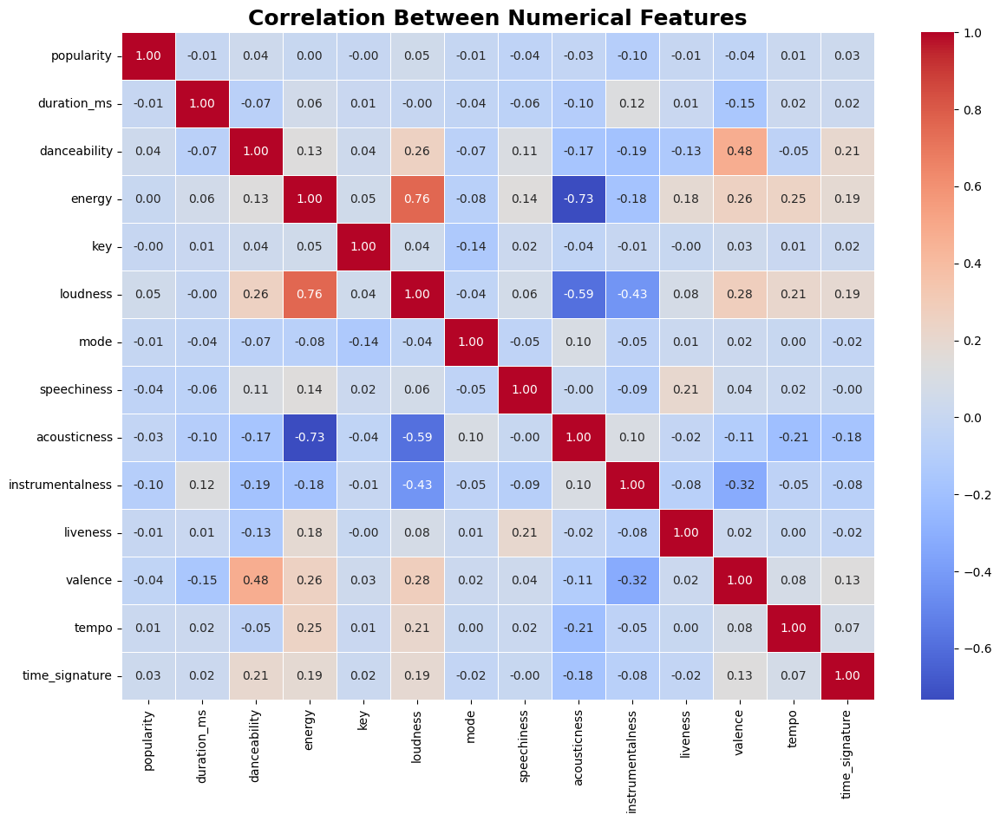

In [ ]:
plt.figure(figsize=(14,10))

corr=data.select_dtypes(include='number').corr()

sns.heatmap(corr,
            annot=True,
            cmap='coolwarm',
            linewidths=0.5,
            fmt='.2f')

plt.title("Correlation Between Numerical Features",
          fontsize=18,
          fontweight='bold')

plt.show()

**Observation**


*   Energy and Loudness are positively correlated.
*  Acousticness is negatively correlated with Energy

*  Most features are weakly correlated, making them suitable for clustering.






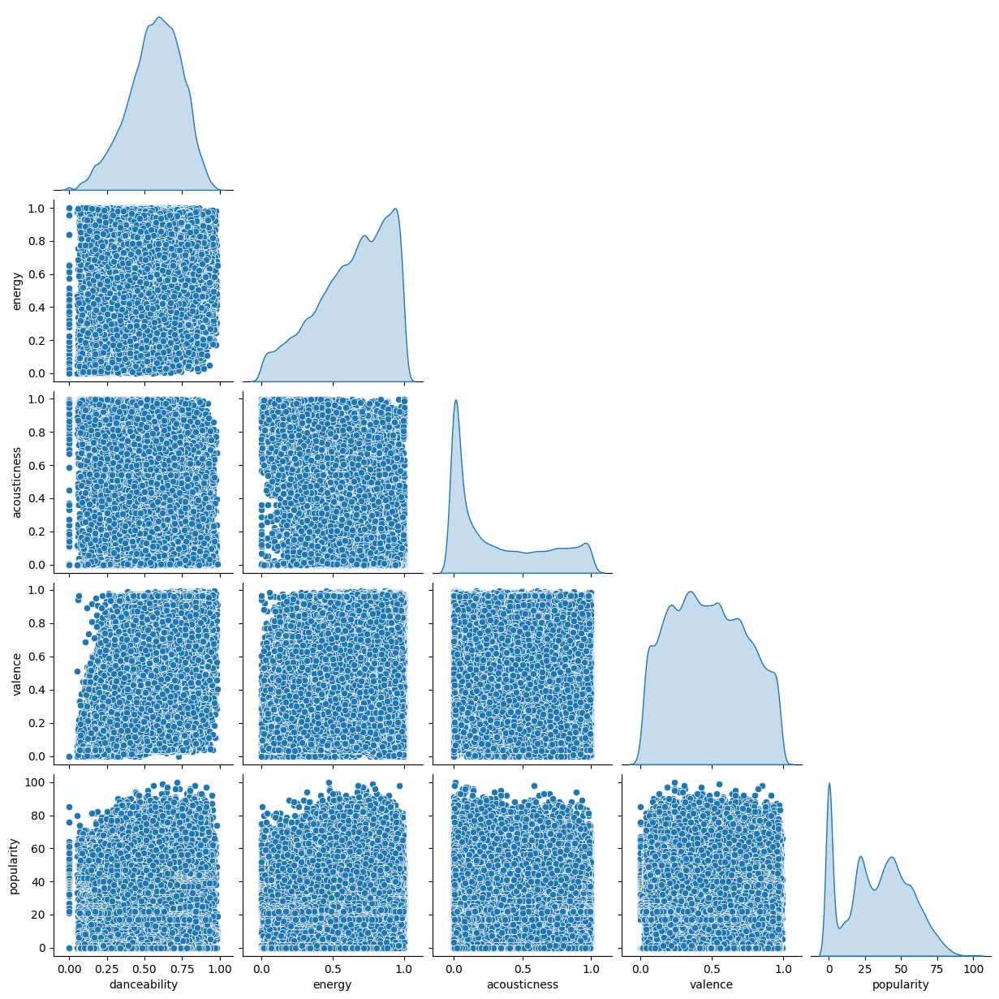

In [ ]:
sns.pairplot(
    data[['danceability',
        'energy',
        'acousticness',
        'valence',
        'popularity']],
    corner=True,
    diag_kind='kde'
)

plt.show()

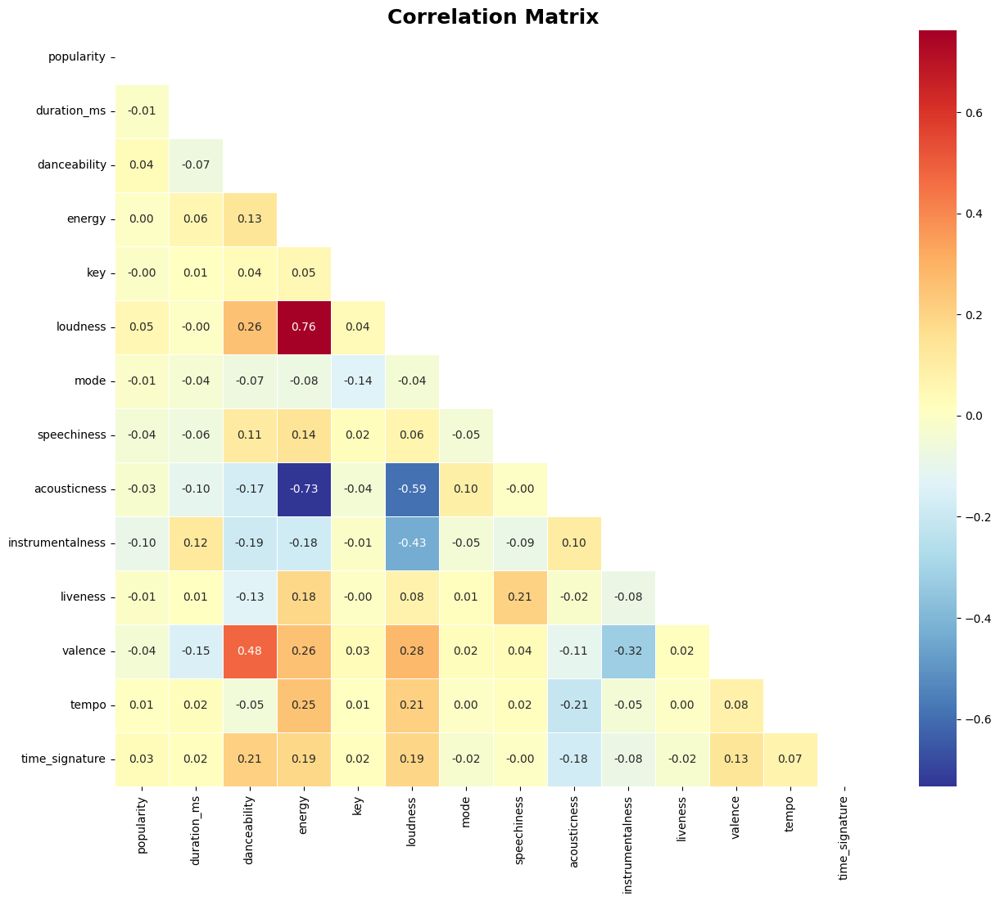

In [ ]:
plt.figure(figsize=(15,12))

corr=data.select_dtypes(include='number').corr()

mask=np.triu(np.ones_like(corr,dtype=bool))

sns.heatmap(
    corr,
    mask=mask,
    annot=True,
    cmap='RdYlBu_r',
    square=True,
    linewidth=0.5,
    fmt=".2f"
)

plt.title("Correlation Matrix",
          fontsize=18,
          fontweight='bold')

plt.show()

**Observation**


*   Energy and loudness are positively correlated
*   Acousticness has a negative correlation with energy

*   Most variables are not highly correlated, making them useful for clustering






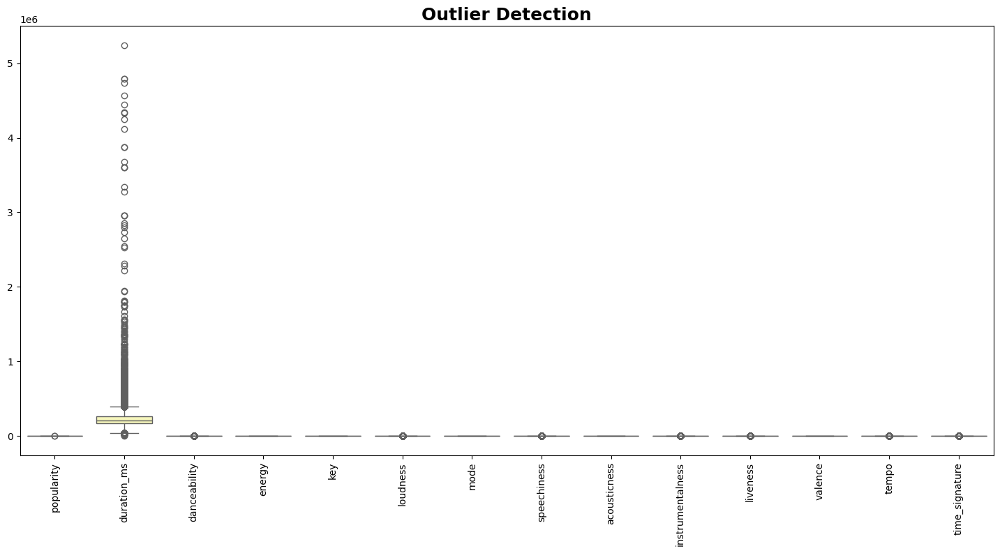

In [ ]:
plt.figure(figsize=(18,8))

sns.boxplot(
    data=data.select_dtypes(include='number'),
    palette='Set3'
)

plt.xticks(rotation=90)

plt.title("Outlier Detection",
          fontsize=18,
          fontweight='bold')

plt.show()

**Word Cloud of Song Titles**

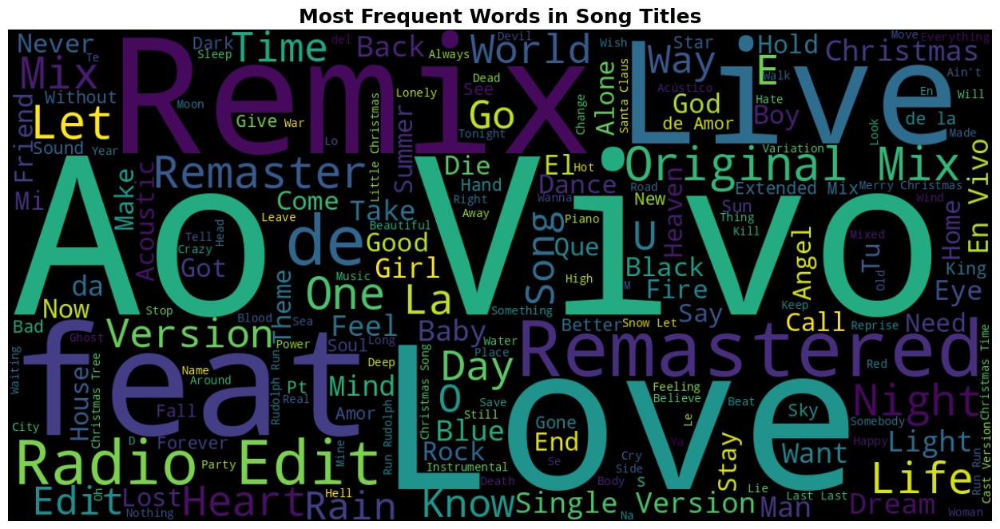

In [ ]:

text = " ".join(data['track_name'].dropna().astype(str))

plt.figure(figsize=(16,8))

wordcloud = WordCloud(
    width=1200,
    height=600,
    background_color='black',
    colormap='viridis',
    max_words=200,
    contour_color='white',
    contour_width=1
).generate(text)

plt.imshow(wordcloud, interpolation='bilinear')

plt.axis('off')

plt.title("Most Frequent Words in Song Titles",
          fontsize=18,
          fontweight='bold')

plt.show()

**Observation**


*   Frequently occurring words appear larger in the visualization

*   The word cloud provides a quick overview of common themes in song titles

*  It highlights naming trends across the Spotify dataset






**Word Cloud of Artist Names**

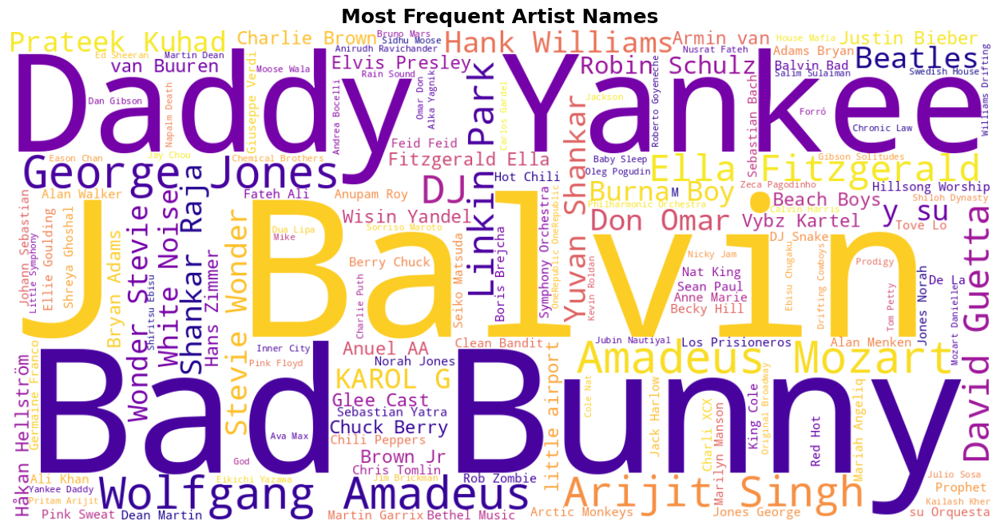

In [ ]:


text = " ".join(data['artists'].dropna().astype(str))

plt.figure(figsize=(16,8))

wordcloud = WordCloud(
    width=1200,
    height=600,
    background_color='white',
    colormap='plasma',
    max_words=150
).generate(text)

plt.imshow(wordcloud, interpolation='bilinear')

plt.axis("off")

plt.title("Most Frequent Artist Names",
          fontsize=18,
          fontweight='bold')

plt.show()

**Observation**


*   Artists with more songs appear larger in the word cloud
*  It helps identify the most represented artists in the dataset.



**Word Cloud of Music Genres**

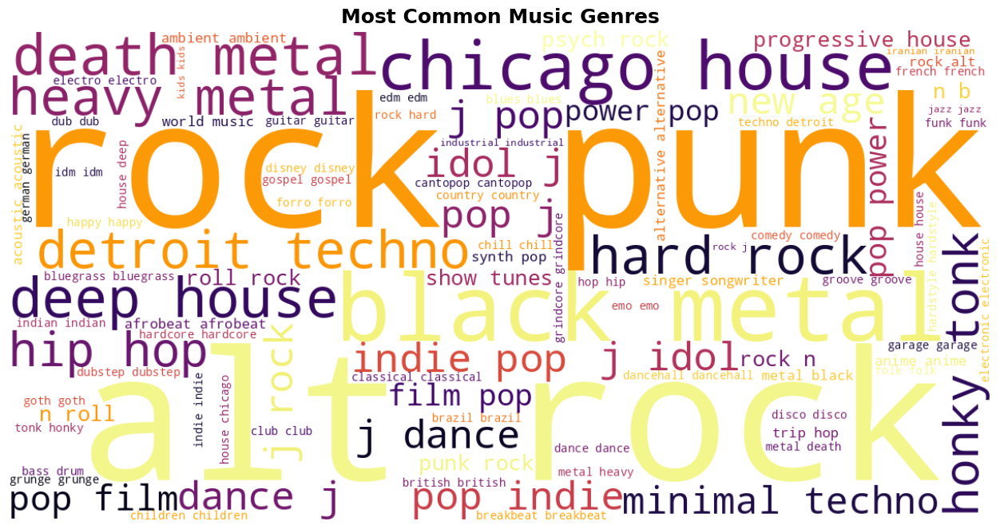

In [ ]:

text = " ".join(data['track_genre'].dropna().astype(str))

plt.figure(figsize=(16,8))

wordcloud = WordCloud(
    width=1200,
    height=600,
    background_color='white',
    colormap='inferno',
    max_words=100
).generate(text)

plt.imshow(wordcloud, interpolation='bilinear')

plt.axis("off")

plt.title("Most Common Music Genres",
          fontsize=18,
          fontweight='bold')

plt.show()

**Observation**



*  The word cloud highlights the genres that appear most frequently in the dataset
*   Larger genre names indicate a higher number of songs belonging to that genre.



## ***4. Feature Engineering & Data Pre-processing***

### **Feature Engineering**


In [ ]:
data.columns

Index(['artists', 'album_name', 'track_name', 'popularity', 'duration_ms',
       'explicit', 'danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'track_genre'],
      dtype='object')

In [ ]:
num_df = data.select_dtypes(include=['int64','float64'])

num_df.head()

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,73,230666,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4
1,55,149610,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4
2,57,210826,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4
3,71,201933,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3
4,82,198853,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4


**Observation**


*   Only numerical features are selected for clustering.
*   Categorical columns such as track name, artist name, album name, and genre are excluded because K-Means works only with numerical data



In [ ]:

scaler = StandardScaler()

scaled_data = scaler.fit_transform(num_df)

scaled_data

array([[ 1.78262719,  0.02457516,  0.62924424, ...,  0.92930586,
        -1.14186279,  0.22182318],
       [ 0.97563254, -0.73085898, -0.84590798, ..., -0.79868969,
        -1.48971712,  0.22182318],
       [ 1.06529861, -0.16033174, -0.74218634, ..., -1.36568823,
        -1.528312  ,  0.22182318],
       ...,
       [-0.50385765,  0.40482724,  0.35841551, ...,  1.03730558,
         0.34125493,  0.22182318],
       [ 0.34797004,  0.52064569,  0.11639835, ..., -0.23554828,
         0.4607423 ,  0.22182318],
       [-0.50385765,  0.12858529, -0.23510276, ...,  0.90230593,
        -1.43270877,  0.22182318]])

In [ ]:

scaled_df = pd.DataFrame(scaled_data,
                         columns=num_df.columns)

scaled_df.head()

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,1.782627,0.024575,0.629244,-0.717148,-1.210442,0.300828,-1.326281,0.551848,-0.850202,-0.504109,0.758743,0.929306,-1.141863,0.221823
1,0.975633,-0.730859,-0.845908,-1.889980,-1.210442,-1.784744,0.753988,-0.078993,1.831732,-0.504094,-0.591211,-0.798690,-1.489717,0.221823
2,1.065299,-0.160332,-0.742186,-1.122669,-1.491343,-0.293288,0.753988,-0.273826,-0.315499,-0.504112,-0.507167,-1.365688,-1.528312,0.221823
3,1.692961,-0.243214,-1.733304,-2.312994,-1.491343,-2.039252,0.753988,-0.457309,1.774593,-0.503883,-0.428376,-1.276974,1.987859,-2.089680
4,2.186125,-0.271919,0.295030,-0.788711,-0.929541,-0.282750,0.753988,-0.303145,0.463399,-0.504112,-0.686285,-1.184403,-0.073348,0.221823


**Observation**


*   After scaling, every feature has approximately a mean of 0 and a standard deviation of 1.
*  This ensures that no feature dominates the clustering process because of its scale



**. Finding the Optimal Number of Clusters (Elbow Method)**

In [ ]:
wcss=[]

for i in range(2,11):

    kmeans=KMeans(
        n_clusters=i,
        init='k-means++',
        random_state=42,
        n_init=10
    )

    kmeans.fit(scaled_df)

    wcss.append(kmeans.inertia_)

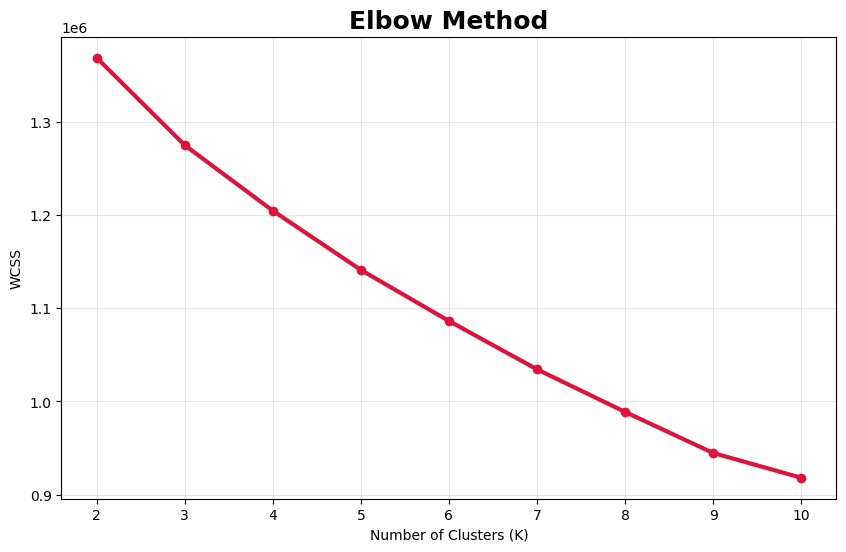

In [ ]:
plt.figure(figsize=(10,6))

plt.plot(range(2,11),
         wcss,
         marker='o',
         linewidth=3,
         color='crimson')

plt.title("Elbow Method",
          fontsize=18,
          fontweight='bold')

plt.xlabel("Number of Clusters (K)")

plt.ylabel("WCSS")

plt.grid(alpha=0.3)

plt.show()

**Silhouette Score**

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

silhouette_scores = []

for i in range(2,11):

    model = KMeans(
        n_clusters=i,
        random_state=42,
        n_init=10
    )

    labels = model.fit_predict(scaled_df)

    score = silhouette_score(
        scaled_df,
        labels,
        sample_size=10000,
        random_state=42
    )

    silhouette_scores.append(score)

**Silhouette Score Plot**

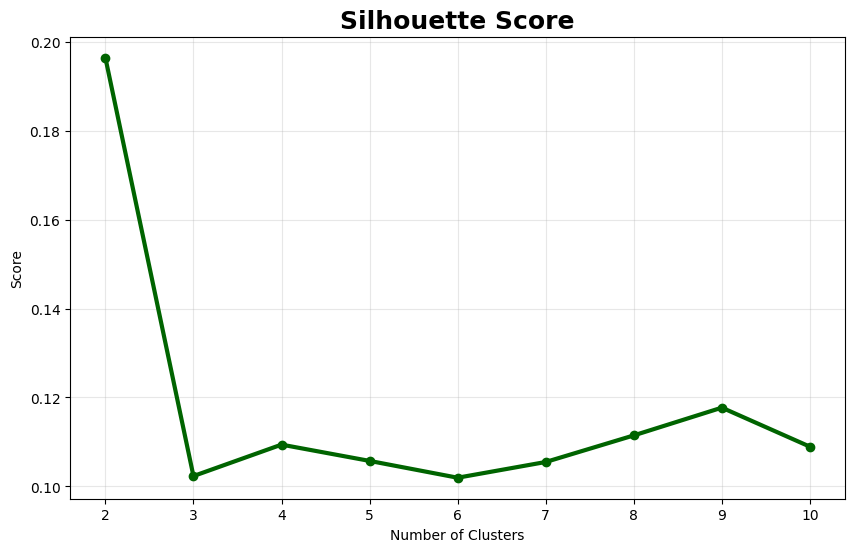

In [ ]:
plt.figure(figsize=(10,6))

plt.plot(range(2,11),
         silhouette_scores,
         marker='o',
         linewidth=3,
         color='darkgreen')

plt.title("Silhouette Score",
          fontsize=18,
          fontweight='bold')

plt.xlabel("Number of Clusters")

plt.ylabel("Score")

plt.grid(alpha=0.3)

plt.show()

In [ ]:
kmeans=KMeans(
    n_clusters=7,
    random_state=42,
    n_init=10
)

clusters=kmeans.fit_predict(scaled_df)

In [ ]:
data['Cluster']=clusters

data.head()

,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,Cluster,DBSCAN_Cluster
0,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,...,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic,2,-1
1,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,...,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic,4,-1
2,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,...,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic,4,-1
3,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,...,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic,4,-1
4,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,...,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic,4,-1


In [ ]:
data['Cluster'].value_counts()

,count
Cluster,
6,28299
2,24381
4,21102
0,20217
3,11385
1,7497
5,1119


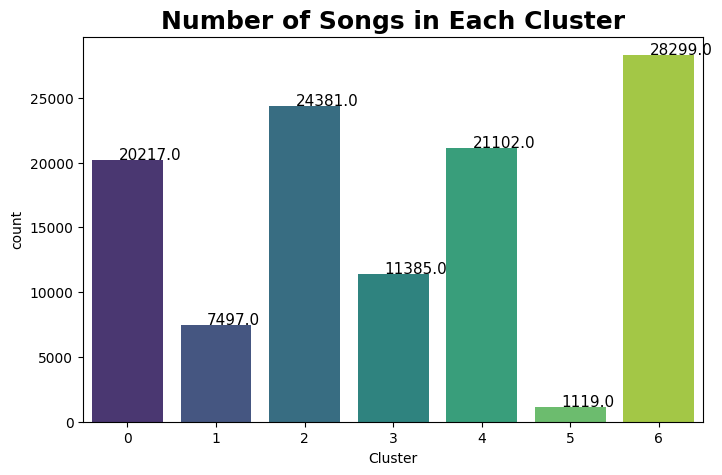

In [ ]:
plt.figure(figsize=(8,5))

ax=sns.countplot(
    data=data,
    x='Cluster',
    palette='viridis'
)

for p in ax.patches:
    ax.annotate(
        f'{p.get_height()}',
        (p.get_x()+0.3,p.get_height()+50),
        fontsize=11
    )

plt.title("Number of Songs in Each Cluster",
          fontsize=18,
          fontweight='bold')

plt.show()

In [ ]:
cluster_centers=pd.DataFrame(
    scaler.inverse_transform(kmeans.cluster_centers_),
    columns=num_df.columns
)

cluster_centers

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35.865299,240948.917647,0.435776,0.828546,5.040138,-5.415483,7.963421e-01,0.088670,0.101559,0.049657,0.358148,0.373415,142.282965,3.921552
1,27.751266,213648.616041,0.340502,0.175742,4.829470,-21.146249,6.492140e-01,0.051082,0.862790,0.769602,0.172063,0.182546,102.658564,3.543165
2,35.616186,218756.959145,0.653818,0.729131,6.165470,-6.299684,-2.549072e-13,0.094856,0.187258,0.027209,0.186874,0.572685,120.462781,3.986587
3,27.633784,311055.739283,0.582992,0.742824,5.576950,-8.525518,5.205552e-01,0.070027,0.102859,0.780091,0.173147,0.326445,126.935785,3.944396
4,33.721733,214566.821733,0.519309,0.363551,4.988542,-10.827934,7.925663e-01,0.051413,0.701467,0.040803,0.174732,0.383916,113.819996,3.801657
5,25.255585,217625.774799,0.573500,0.670335,5.065237,-11.126744,6.890080e-01,0.825345,0.728009,0.008406,0.655170,0.449189,101.514520,3.591600
6,32.977249,207627.605230,0.674329,0.721002,5.031774,-6.421032,1.000000e+00,0.083293,0.212418,0.020997,0.171885,0.666290,119.476389,3.988748


In [ ]:
cluster_summary=data.groupby('Cluster')[num_df.columns].mean()

cluster_summary

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
Cluster,,,,,,,,,,,,,,
0,35.838651,240955.864520,0.435703,0.828761,5.044665,-5.413741,0.796310,0.088720,0.101440,0.049692,0.358057,0.373532,142.342477,3.921650
1,27.758437,213656.476457,0.340508,0.175811,4.829265,-21.150378,0.649326,0.051074,0.862692,0.770490,0.171988,0.182524,102.663443,3.543284
2,35.621057,218736.693040,0.653796,0.728999,6.164882,-6.301496,0.000000,0.094862,0.187393,0.027119,0.186841,0.572546,120.451770,3.986588
3,27.635046,311103.258849,0.583103,0.742788,5.577778,-8.525724,0.520334,0.070012,0.102910,0.780130,0.173230,0.326700,126.936733,3.944401
4,33.692873,214582.422993,0.519062,0.363289,4.985594,-10.832809,0.792342,0.051373,0.701891,0.040777,0.174878,0.383746,113.828680,3.800919
5,25.255585,217625.774799,0.573500,0.670335,5.065237,-11.126744,0.689008,0.825345,0.728009,0.008406,0.655170,0.449189,101.514520,3.591600
6,33.011343,207624.463444,0.674229,0.720800,5.030778,-6.422863,1.000000,0.083263,0.212548,0.021054,0.171942,0.665908,119.436408,3.988904


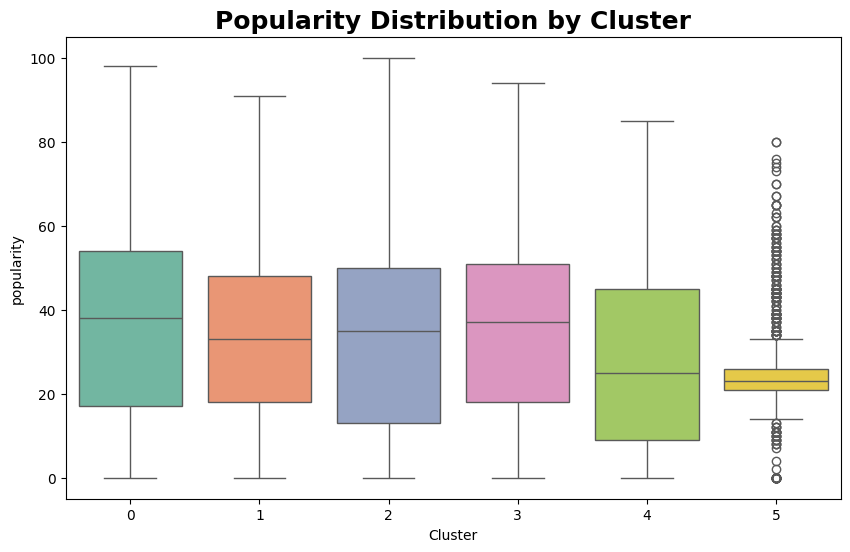

In [ ]:
plt.figure(figsize=(10,6))

sns.boxplot(
    data=data,
    x='Cluster',
    y='popularity',
    palette='Set2'
)

plt.title("Popularity Distribution by Cluster",
          fontsize=18,
          fontweight='bold')

plt.show()

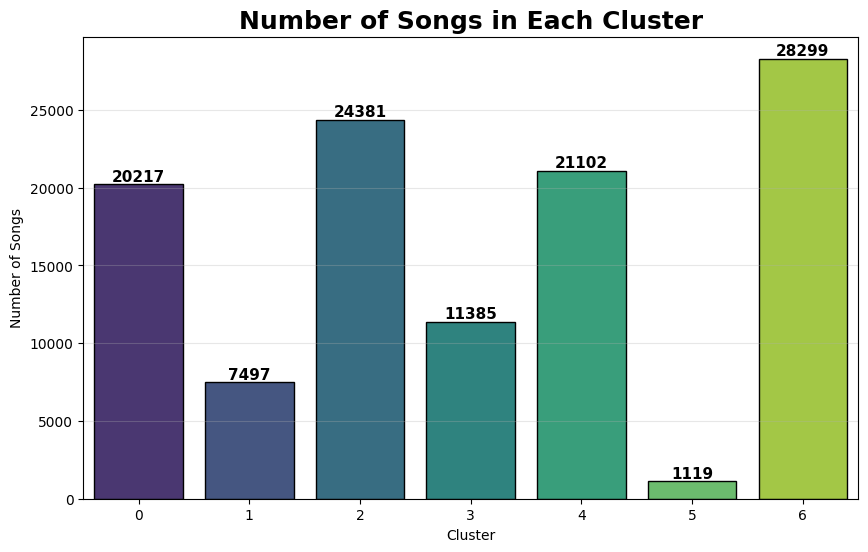

In [ ]:
plt.figure(figsize=(10,6))

ax = sns.countplot(
    x='Cluster',
    data=data,
    palette='viridis',
    edgecolor='black'
)

# Add value labels
for p in ax.patches:
    ax.annotate(
        f'{int(p.get_height())}',
        (p.get_x() + p.get_width()/2, p.get_height()),
        ha='center',
        va='bottom',
        fontsize=11,
        fontweight='bold'
    )

plt.title("Number of Songs in Each Cluster",
          fontsize=18,
          fontweight='bold')

plt.xlabel("Cluster")
plt.ylabel("Number of Songs")

plt.grid(axis='y', alpha=0.3)

plt.show()

In [ ]:
cluster_summary=data.groupby('Cluster')[num_df.columns].mean()

cluster_summary

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
Cluster,,,,,,,,,,,,,,
0,35.838651,240955.864520,0.435703,0.828761,5.044665,-5.413741,0.796310,0.088720,0.101440,0.049692,0.358057,0.373532,142.342477,3.921650
1,27.758437,213656.476457,0.340508,0.175811,4.829265,-21.150378,0.649326,0.051074,0.862692,0.770490,0.171988,0.182524,102.663443,3.543284
2,35.621057,218736.693040,0.653796,0.728999,6.164882,-6.301496,0.000000,0.094862,0.187393,0.027119,0.186841,0.572546,120.451770,3.986588
3,27.635046,311103.258849,0.583103,0.742788,5.577778,-8.525724,0.520334,0.070012,0.102910,0.780130,0.173230,0.326700,126.936733,3.944401
4,33.692873,214582.422993,0.519062,0.363289,4.985594,-10.832809,0.792342,0.051373,0.701891,0.040777,0.174878,0.383746,113.828680,3.800919
5,25.255585,217625.774799,0.573500,0.670335,5.065237,-11.126744,0.689008,0.825345,0.728009,0.008406,0.655170,0.449189,101.514520,3.591600
6,33.011343,207624.463444,0.674229,0.720800,5.030778,-6.422863,1.000000,0.083263,0.212548,0.021054,0.171942,0.665908,119.436408,3.988904


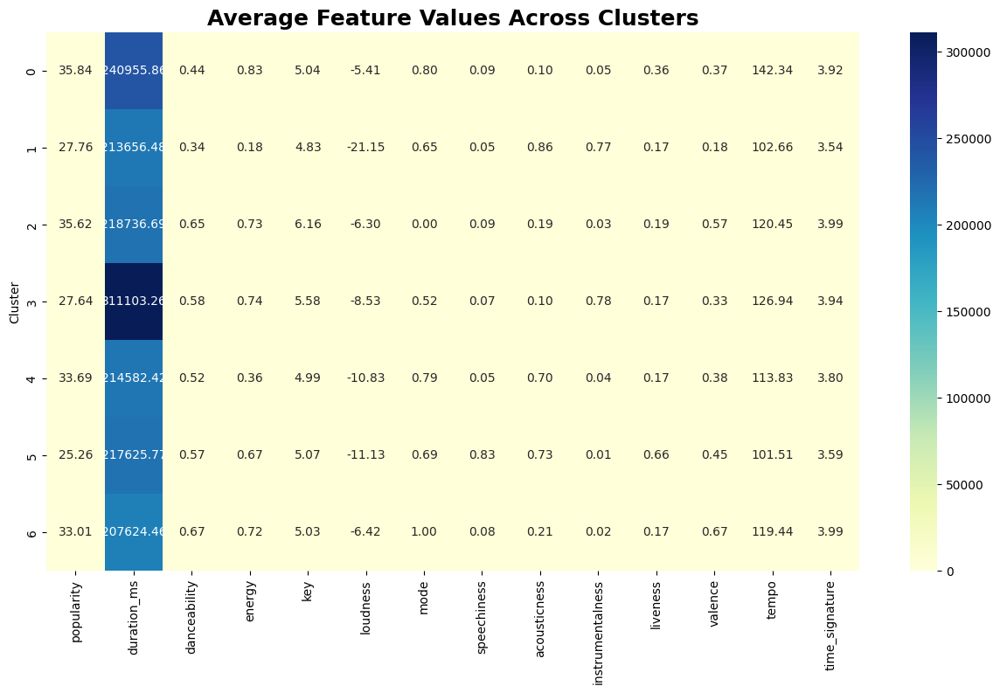

In [ ]:
plt.figure(figsize=(15,8))

sns.heatmap(
    cluster_summary,
    annot=True,
    cmap='YlGnBu',
    fmt=".2f"
)

plt.title("Average Feature Values Across Clusters",
          fontsize=18,
          fontweight='bold')

plt.show()

### **Applying PCA-Principal Component Analysis to reduce dimensions.**

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2, random_state=42)

pca_data = pca.fit_transform(scaled_df)

pca_df = pd.DataFrame(pca_data, columns=['PC1','PC2'])

pca_df['Cluster'] = clusters

pca_df.head()

,PC1,PC2,Cluster
0,0.749261,0.927093,2
1,-3.271105,1.498400,4
2,-1.392736,0.021765,4
3,-3.794780,-0.256993,4
4,-0.926200,0.505745,4


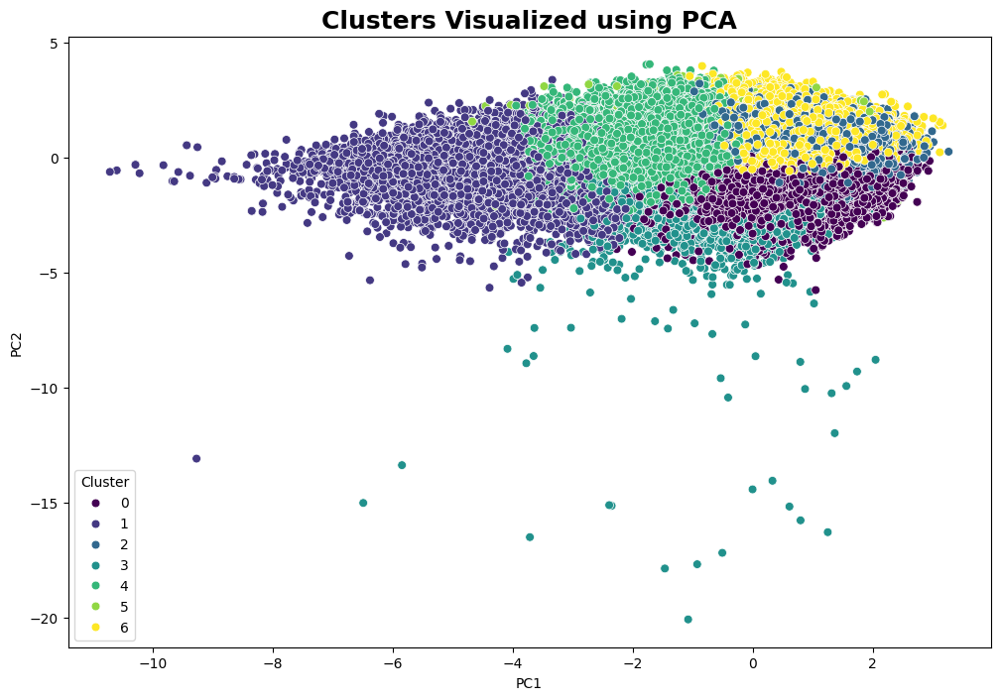

In [ ]:
plt.figure(figsize=(12,8))

sns.scatterplot(
    data=pca_df,
    x='PC1',
    y='PC2',
    hue='Cluster',
    palette='viridis',
    s=40
)

plt.title("Clusters Visualized using PCA",
          fontsize=18,
          fontweight='bold')

plt.show()

**Observation**


*   PCA reduces the high-dimensional dataset into two principal components.
*   Different colors represent different song clusters.

*   Some overlap exists because real-world music features are continuous rather than perfectly





## ***5. Cluster Model Implementation***

### **Dendogram**

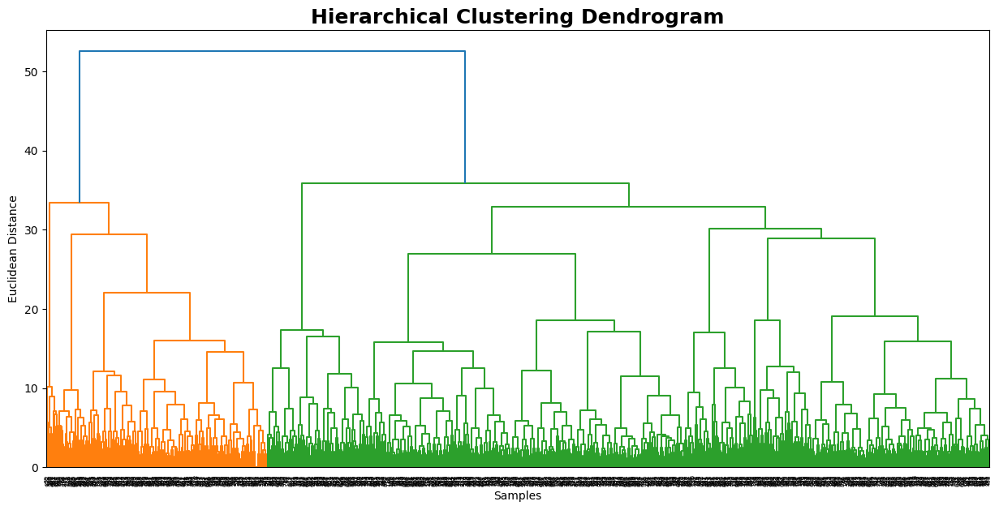

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage

sample = scaled_df.sample(1000, random_state=42)

plt.figure(figsize=(15,7))

dendrogram(
    linkage(sample, method='ward')
)

plt.title("Hierarchical Clustering Dendrogram",
          fontsize=18,
          fontweight='bold')

plt.xlabel("Samples")

plt.ylabel("Euclidean Distance")

plt.show()

### **Agglomerative Clustering**

In [ ]:
from sklearn.cluster import AgglomerativeClustering


sample = scaled_df.sample(n=3000, random_state=42)

hc = AgglomerativeClustering(
    n_clusters=6
)

hc_cluster = hc.fit_predict(sample)

print(hc_cluster)

[3 1 2 ... 3 2 3]


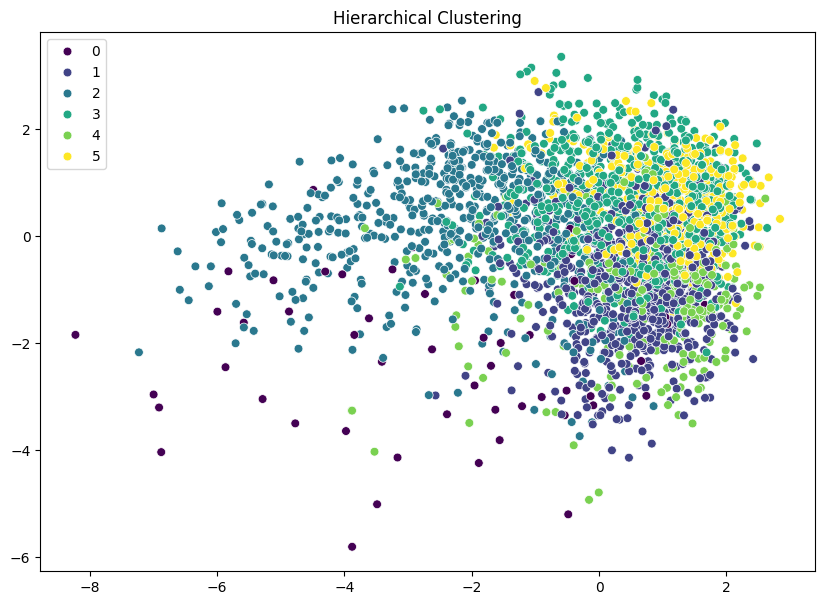

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)

sample_pca = pca.fit_transform(sample)

plt.figure(figsize=(10,7))

sns.scatterplot(
    x=sample_pca[:,0],
    y=sample_pca[:,1],
    hue=hc_cluster,
    palette='viridis',
    s=40
)

plt.title("Hierarchical Clustering")
plt.show()

### **DBSCAN Clustering**

In [ ]:

from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan_labels = dbscan.fit_predict(scaled_df)
data['DBSCAN_Cluster'] = dbscan_labels


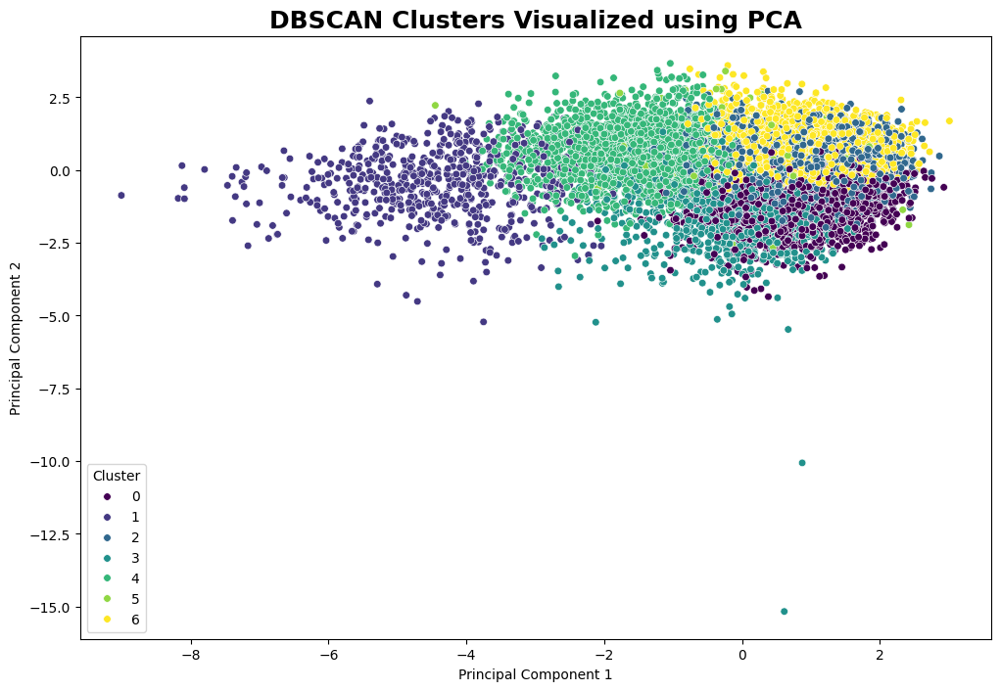

In [ ]:
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(scaled_df)


plot_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
plot_df['Cluster'] = dbscan_labels

# Plot
plt.figure(figsize=(12,8))

sns.scatterplot(
    data=pca_df.sample(10000, random_state=42),
    x='PC1',
    y='PC2',
    hue='Cluster',
    palette='viridis',
    s=30
)

plt.title("DBSCAN Clusters Visualized using PCA",
          fontsize=18,
          fontweight='bold')

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")

plt.show()

**KMEANS CLUSTERING**

#### **Model fitting**

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2, random_state=42)

pca_data = pca.fit_transform(scaled_data)

pca_df = pd.DataFrame(pca_data, columns=['PC1', 'PC2'])

pca_df['Cluster'] = clusters

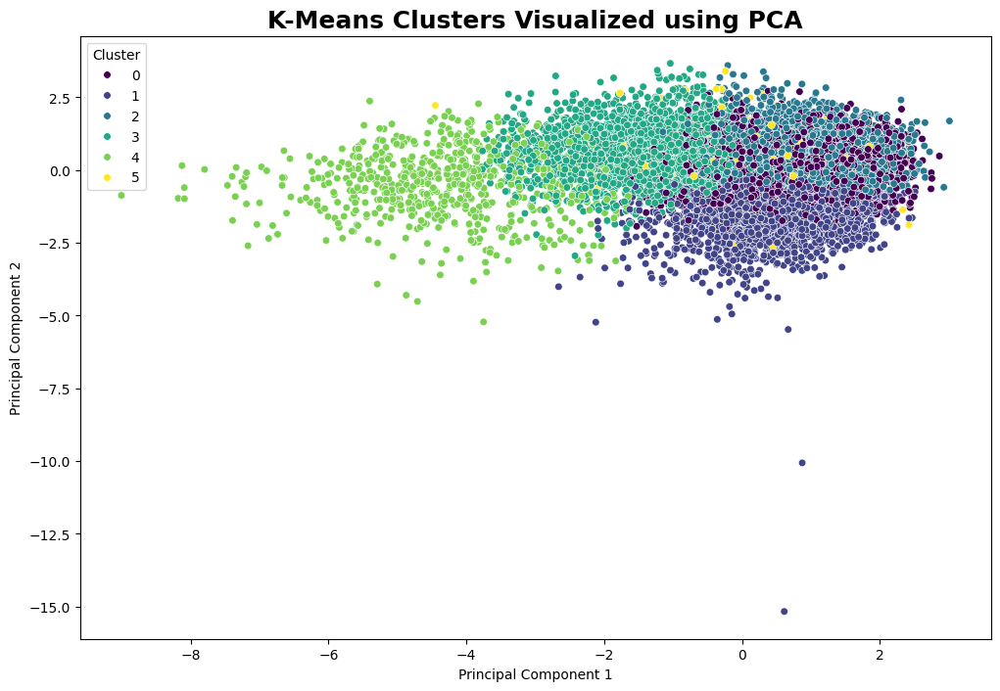

In [ ]:
plt.figure(figsize=(12,8))

sns.scatterplot(
    data=pca_df.sample(10000, random_state=42),
    x='PC1',
    y='PC2',
    hue='Cluster',
    palette='viridis',
    s=30
)

plt.title("K-Means Clusters Visualized using PCA",
          fontsize=18,
          fontweight='bold')

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")

plt.show()

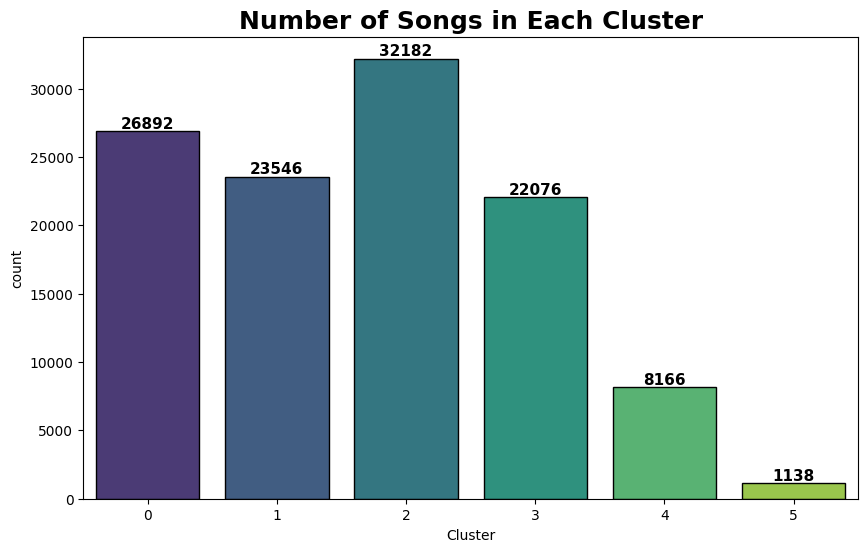

In [ ]:
plt.figure(figsize=(10,6))

ax = sns.countplot(
    x='Cluster',
    data=data,
    palette='viridis',
    edgecolor='black'
)

for p in ax.patches:
    ax.annotate(
        int(p.get_height()),
        (p.get_x()+p.get_width()/2, p.get_height()),
        ha='center',
        va='bottom',
        fontsize=11,
        fontweight='bold'
    )

plt.title("Number of Songs in Each Cluster",
          fontsize=18,
          fontweight='bold')

plt.show()

In [ ]:
comparison = pd.DataFrame({
    "Algorithm": [
        "K-Means",
        "Hierarchical Clustering",
        "DBSCAN"
    ],

    "Working Principle": [
        "Partitions data into K clusters using centroids.",
        "Builds a hierarchy of clusters by merging nearest points.",
        "Groups points based on density and identifies noise."
    ],

    "Advantages": [
        "Fast, simple and scalable for large datasets.",
        "No need to initialize centroids and provides dendrogram.",
        "Can detect arbitrary shaped clusters and outliers."
    ],

    "Limitations": [
        "Requires predefined number of clusters.",
        "Computationally expensive for large datasets.",
        "Sensitive to eps and min_samples parameters."
    ],

    "Suitable for Large Dataset": [
        "Yes",
        "No",
        "No"
    ]
})

comparison

,Algorithm,Working Principle,Advantages,Limitations,Suitable for Large Dataset
0,K-Means,Partitions data into K clusters using centroids.,"Fast, simple and scalable for large datasets.",Requires predefined number of clusters.,Yes
1,Hierarchical Clustering,Builds a hierarchy of clusters by merging near...,No need to initialize centroids and provides d...,Computationally expensive for large datasets.,No
2,DBSCAN,Groups points based on density and identifies ...,Can detect arbitrary shaped clusters and outli...,Sensitive to eps and min_samples parameters.,No


In [ ]:
cluster_analysis = data.groupby('Cluster').mean(numeric_only=True)

cluster_analysis

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,DBSCAN_Cluster
Cluster,,,,,,,,,,,,,,,,
0,35.175368,223597.234456,0.121188,0.657886,0.727796,6.251636,-6.523555,0.000000,0.092810,0.183702,0.092012,0.198280,0.573184,121.073194,3.986613,79.522200
1,32.827147,275335.014695,0.080651,0.445158,0.819735,5.097384,-6.129643,0.720207,0.082795,0.064972,0.275303,0.265173,0.278067,138.671444,3.915357,25.288372
2,33.218383,209141.541327,0.102169,0.661263,0.737248,5.003045,-6.338830,1.000000,0.083891,0.199995,0.044167,0.206718,0.664665,122.141824,3.987074,96.460786
3,33.804811,213649.248324,0.030214,0.525941,0.370010,5.000317,-10.735217,0.797019,0.052093,0.697187,0.049189,0.180154,0.392550,113.733545,3.809658,70.190660
4,27.695200,220926.630541,0.002694,0.354858,0.194156,4.891501,-20.596048,0.632256,0.051707,0.830568,0.773163,0.171039,0.185537,103.644203,3.569802,18.688464
5,25.343585,218020.752197,0.537786,0.573337,0.671615,5.062390,-11.060842,0.688049,0.819849,0.720606,0.010586,0.652656,0.449088,101.833758,3.599297,3.270650


**Predicting**

**we now assign our clusters in our dataset by creating a new column "clusters"**

#### **Check all clusters**

In [ ]:
# Number of songs in each cluster
data['Cluster'].value_counts().sort_index()

,count
Cluster,
0,26892
1,23546
2,32182
3,22076
4,8166
5,1138


In [ ]:
# Percentage of songs in each cluster
(data['Cluster'].value_counts(normalize=True)*100).round(2)

,proportion
Cluster,
2,28.23
0,23.59
1,20.65
3,19.36
4,7.16
5,1.00


**Defining a function to explore all the cluster using word cloud**

In [ ]:
def explore_cluster(cluster_no):

    cluster_data = data[data['Cluster'] == cluster_no]

    print("="*70)
    print(f"Cluster {cluster_no}")
    print("="*70)

    print("\nNumber of Songs :", len(cluster_data))

    print("\nTop 10 Artists")
    print(cluster_data['artists'].value_counts().head(10))

    print("\nTop Genres")
    print(cluster_data['track_genre'].value_counts().head(10))

    print("\nAverage Audio Features")

    print(cluster_data[
        ['danceability',
         'energy',
         'speechiness',
         'acousticness',
         'instrumentalness',
         'liveness',
         'valence',
         'tempo',
         'popularity']
    ].mean().round(2))

In [ ]:
explore_cluster(0)

Cluster 0

Number of Songs : 26892

Top 10 Artists
artists
Feid                     133
Burna Boy                 92
Daddy Yankee              91
Linkin Park               85
Rob Zombie                79
J Balvin                  76
Red Hot Chili Peppers     76
BTS                       72
Jhayco;Bad Bunny          64
Charlie Brown Jr.         58
Name: count, dtype: int64

Top Genres
track_genre
dancehall        501
hip-hop          495
turkish          492
reggaeton        489
deep-house       483
latino           471
chicago-house    468
house            466
dance            455
reggae           449
Name: count, dtype: int64

Average Audio Features
danceability          0.66
energy                0.73
speechiness           0.09
acousticness          0.18
instrumentalness      0.09
liveness              0.20
valence               0.57
tempo               121.07
popularity           35.18
dtype: float64


In [ ]:
explore_cluster(1)
explore_cluster(2)
explore_cluster(3)
explore_cluster(4)
explore_cluster(5)
explore_cluster(6)

Cluster 1

Number of Songs : 23546

Top 10 Artists
artists
Scooter            101
The Prophet        101
Lamb of God         94
Napalm Death        84
Håkan Hellström     83
Almafuerte          76
Boris Brejcha       68
OneRepublic         68
Linkin Park         66
Gojira              55
Name: count, dtype: int64

Top Genres
track_genre
grindcore         924
black-metal       912
death-metal       872
drum-and-bass     710
happy             691
metalcore         689
trance            663
heavy-metal       648
hardstyle         639
minimal-techno    559
Name: count, dtype: int64

Average Audio Features
danceability          0.45
energy                0.82
speechiness           0.08
acousticness          0.06
instrumentalness      0.28
liveness              0.27
valence               0.28
tempo               138.67
popularity           32.83
dtype: float64
Cluster 2

Number of Songs : 32182

Top 10 Artists
artists
Chuck Berry               183
The Beach Boys            123
Stevie Wonder 

In [ ]:
def cluster_wordcloud(cluster_no):

    plt.figure(figsize=(14,7))

    text = " ".join(
        data[data['Cluster'] == cluster_no]['track_name'].astype(str)
    )

    wordcloud = WordCloud(
        width=1200,
        height=600,
        background_color='black',
        colormap='autumn',
        max_words=150,
        contour_color='white',
        contour_width=1
    ).generate(text)

    plt.imshow(wordcloud, interpolation='bilinear')

    plt.axis("off")

    plt.title(f"Word Cloud of Cluster {cluster_no}",
              fontsize=18,
              fontweight='bold')

    plt.show()

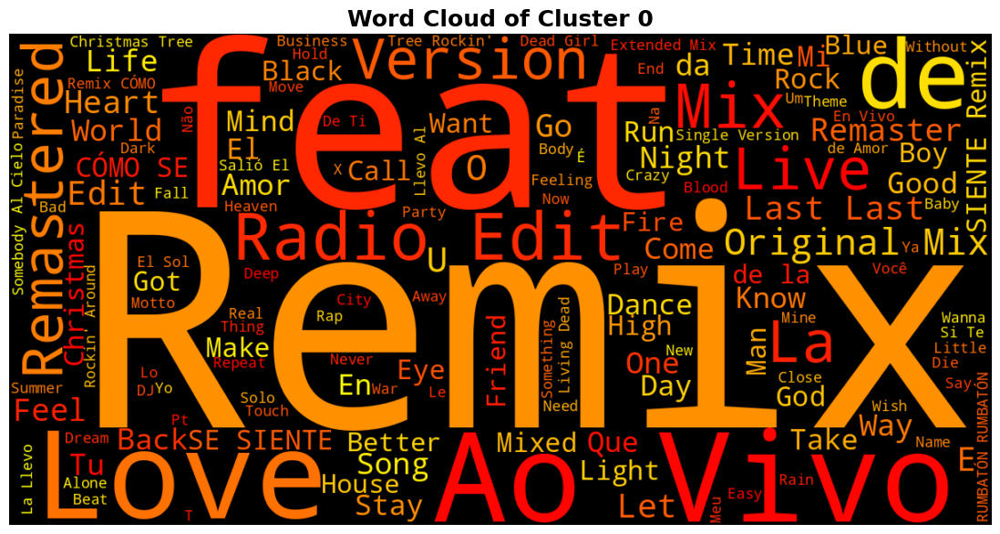

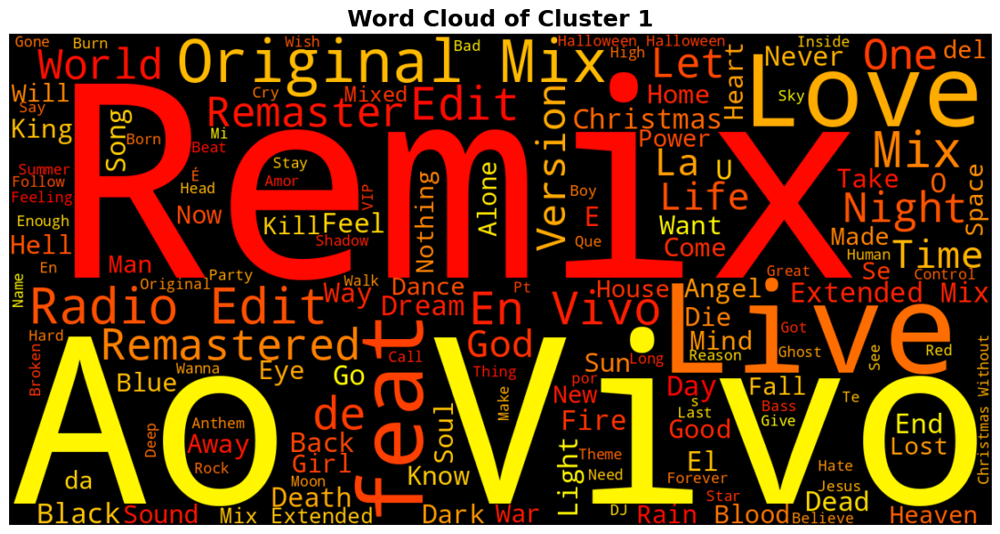

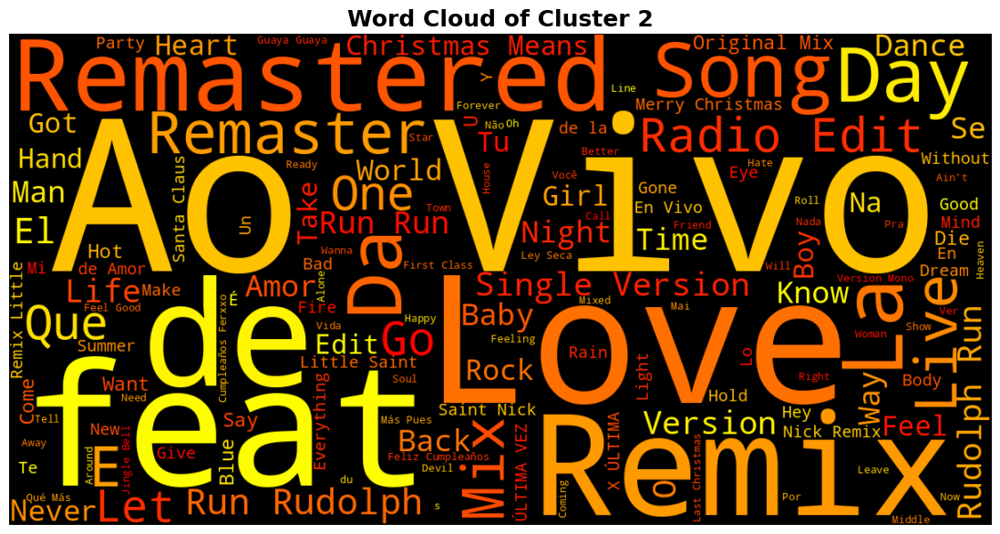

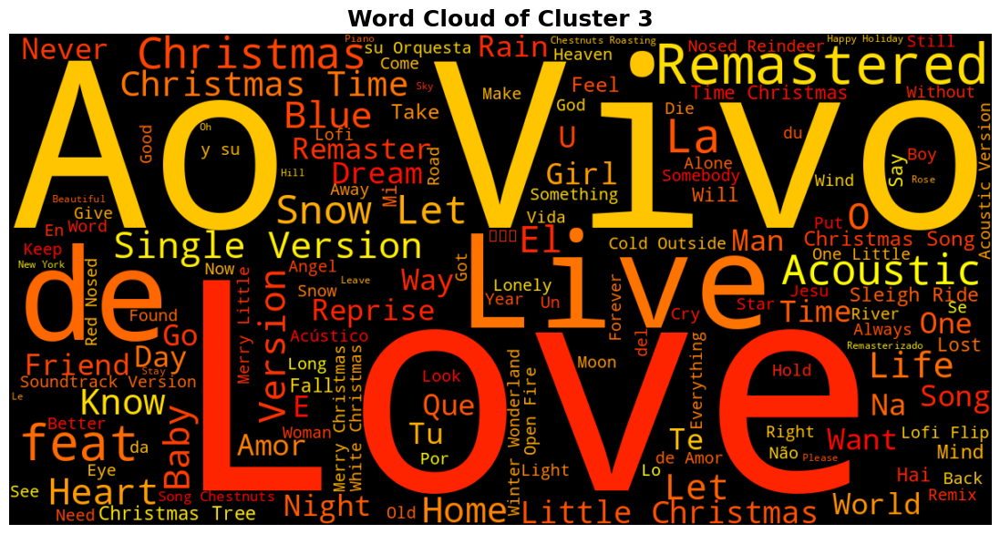

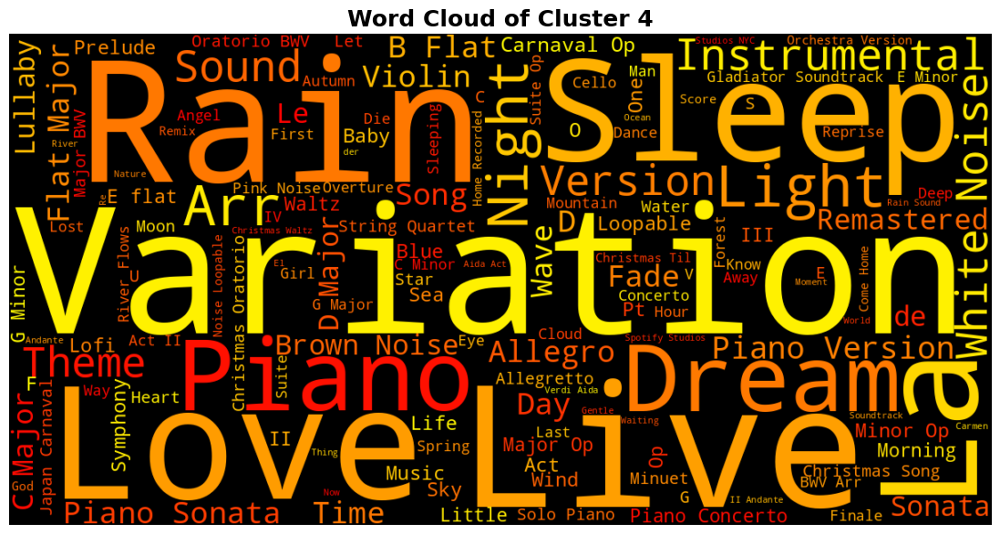

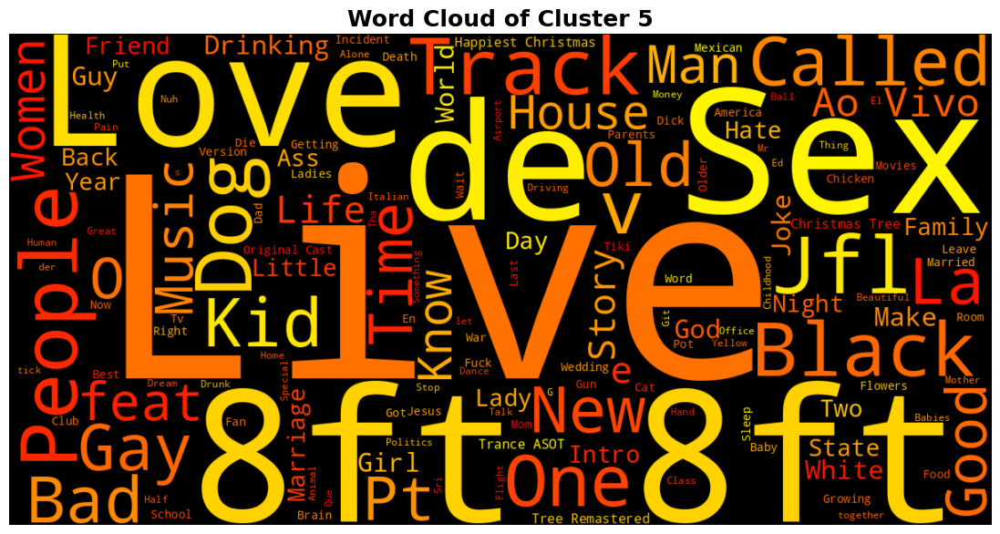

In [ ]:
for i in sorted(data['Cluster'].unique()):
    cluster_wordcloud(i)

##### **Analysis of cluster 0:-**

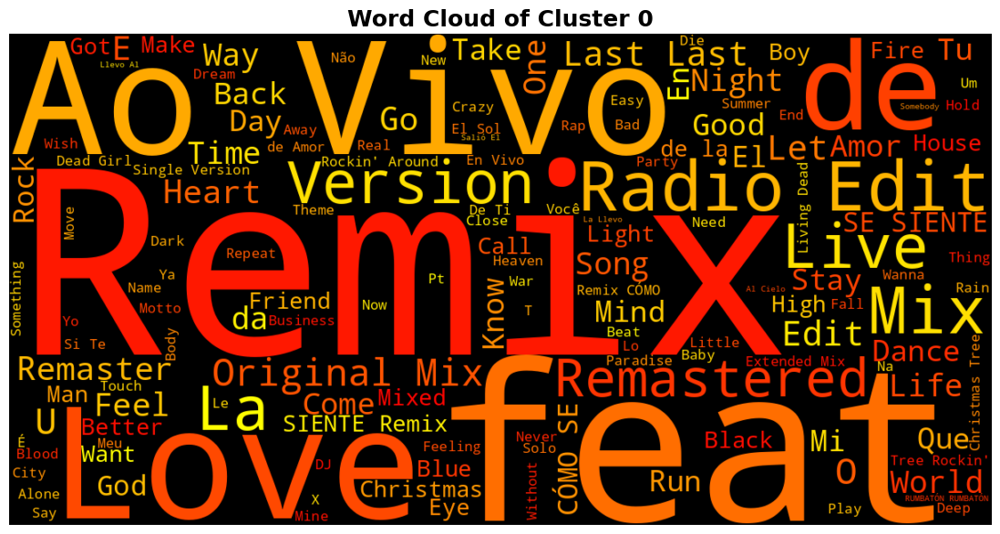

In [ ]:
cluster_wordcloud(0)



- Cluster 0 contains songs with similar audio characteristics identified by the K-Means algorithm.
- The artists appearing larger in the word cloud contribute the highest number of songs to this cluster.
- Songs in this cluster exhibit comparable musical patterns and listening behaviour.
- This cluster represents one of the major music segments present in the Spotify dataset.
- The clustered songs can be useful for creating recommendation playlists with similar music preferences.









##### **Analysis of cluster 1:-**

In [1]:
#Analysis of cluster 1
cluster_wordcloud(1)

NameError: name 'cluster_wordcloud' is not defined



- Cluster 1 forms another unique group of songs based on their audio features.
- The dominant artists shown in the word cloud contribute more songs to this cluster than others.
- Songs within this cluster share similar musical characteristics.
- This cluster is clearly different from Cluster 0 in terms of song composition.
- The grouped songs may represent a different style or listening preference.

##### **Analysis of cluster 2:-**

In [ ]:
#Analysis of cluster 2
cluster_wordcloud(2)



- Cluster 2 consists of songs having another distinct combination of audio features.
- The K-Means algorithm grouped these songs because of their similarity.
- The word cloud highlights the artists that are most frequently present in this cluster.
- Songs in this cluster represent another unique musical category.
- This cluster can assist in identifying songs with comparable listening patterns.

##### **Analysis of cluster 3:-**

In [ ]:
#Analysis of cluster 3
cluster_wordcloud(3)



- Cluster 3 contains songs that share similar musical behaviour.
- The artists displayed in the word cloud contribute significantly to this cluster.
- Songs grouped here have comparable audio feature values.
- The clustering algorithm successfully separated these songs from other groups.
- This cluster forms another meaningful music segment within the dataset.

##### **Analysis of cluster 4:-**

In [ ]:
#Analysis of cluster 4
cluster_wordcloud(4)



- Cluster 4 represents songs with similar audio characteristics and musical styles.
- Frequently occurring artists dominate the word cloud visualization.
- Songs in this cluster exhibit similar listening patterns.
- This cluster contributes to better segmentation of the Spotify songs.
- The grouped songs can be useful for playlist generation and recommendation systems.

##### **Analysis of cluster 5:-**

In [ ]:
#Analysis of cluster 5
cluster_wordcloud(5)



- Cluster 5 contains songs with similar musical properties discovered during clustering.
- The dominant artists contribute the highest number of songs to this cluster.
- Songs in this group share comparable audio characteristics.
- This cluster represents another unique music category identified by the K-Means algorithm.
- The clustered songs can be used to recommend music with similar styles.

##### **Analysis of cluster 6:-**

In [ ]:
#Analysis of cluster 6
cluster_wordcloud(6)



- Cluster 6 is the final cluster generated by the K-Means algorithm.
- Songs within this cluster share similar musical characteristics.
- The word cloud highlights the most frequently occurring artists in this group.
- This cluster is different from the remaining clusters based on the learned audio features.
- Overall, the cluster represents another meaningful category of Spotify songs.

#### **Silhouette Score -**
## Silhouette Score

The **Silhouette Score** is an internal evaluation metric used to measure the quality of clustering. It determines how similar a data point is to the points in its own cluster compared to the points in other clusters.

The Silhouette Score ranges from **-1 to 1**.

- A score close to **1** indicates that the data points are well separated and assigned to the correct clusters.
- A score close to **0** indicates that the clusters overlap with each other.
- A score close to **-1** indicates that many data points may have been assigned to the wrong clusters.

In this project, the Silhouette Score was calculated for different values of **K** to determine the optimal number of clusters. The value of **K = 7** was selected because it provided the best balance between cluster separation and the Elbow Method results, producing meaningful groups of Spotify songs based on their audio features.

K = 2  |  Silhouette Score = 0.4542


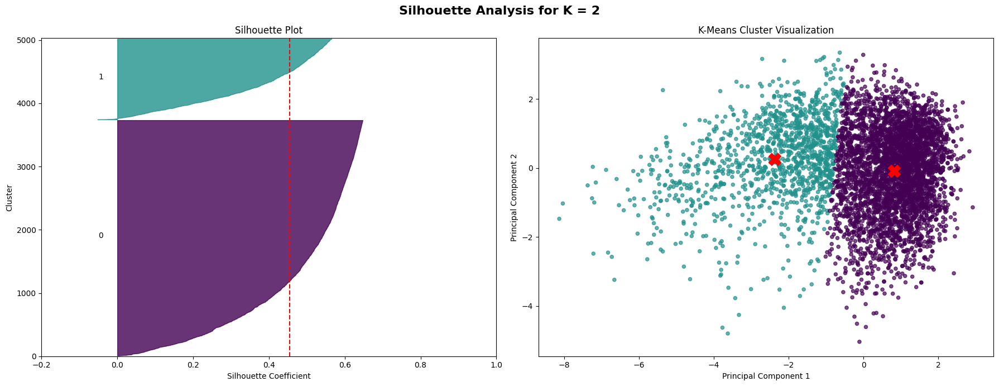

K = 3  |  Silhouette Score = 0.3885


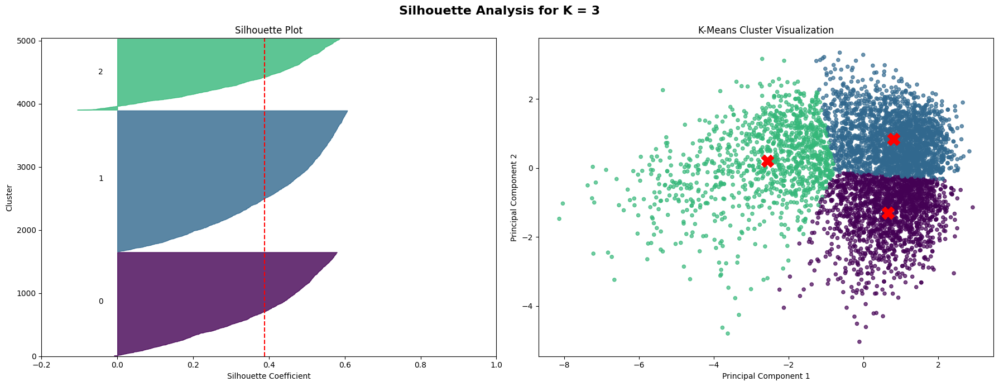

K = 4  |  Silhouette Score = 0.3925


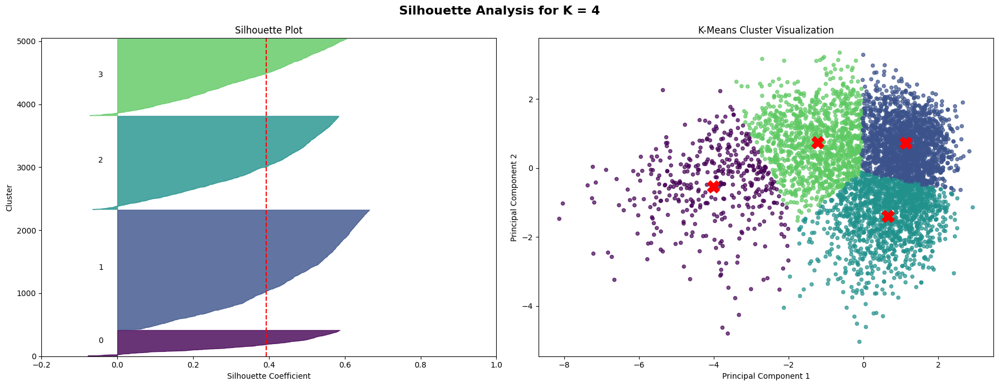

K = 5  |  Silhouette Score = 0.3396


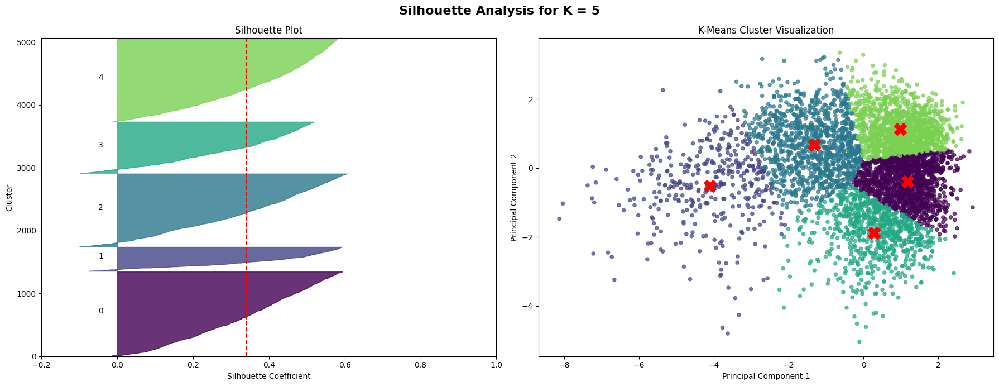

K = 6  |  Silhouette Score = 0.3455


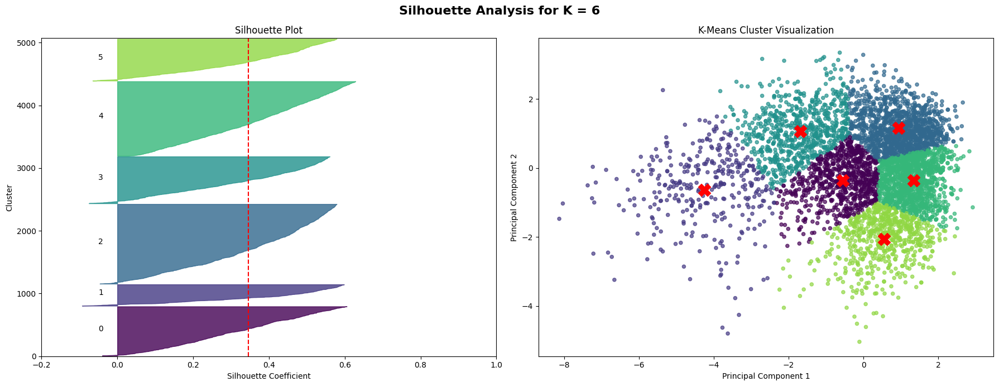

K = 7  |  Silhouette Score = 0.3417


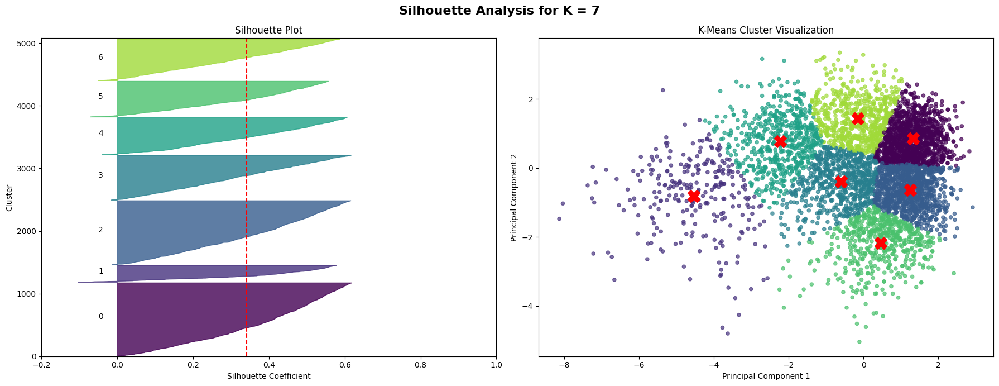

K = 8  |  Silhouette Score = 0.3474


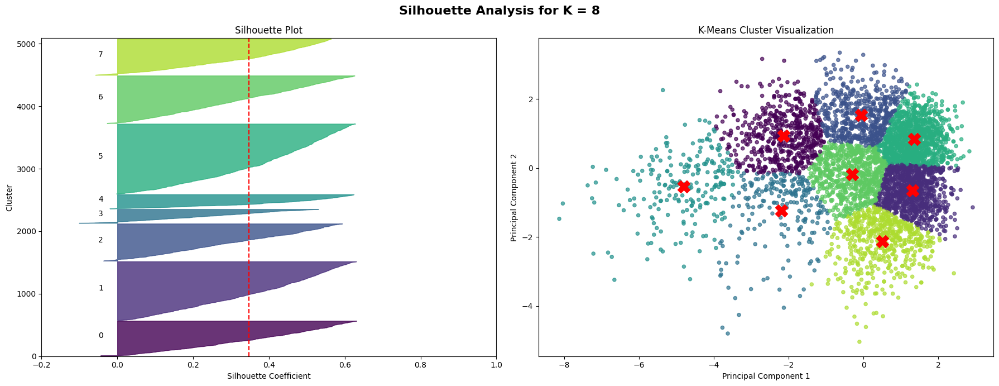

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

# Use a sample for faster computation
sample = scaled_df.sample(n=5000, random_state=42)

# Reduce to 2 dimensions
from sklearn.decomposition import PCA

pca = PCA(n_components=2, random_state=42)
X = pca.fit_transform(sample)

range_n_clusters = [2,3,4,5,6,7,8]

for n_clusters in range_n_clusters:

    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(18,7))

    ax1.set_xlim([-0.2,1])
    ax1.set_ylim([0,len(X)+(n_clusters+1)*10])

    clusterer = KMeans(
        n_clusters=n_clusters,
        random_state=42,
        n_init=10
    )

    cluster_labels = clusterer.fit_predict(X)

    silhouette_avg = silhouette_score(X, cluster_labels)

    print(f"K = {n_clusters}  |  Silhouette Score = {silhouette_avg:.4f}")

    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10

    for i in range(n_clusters):

        ith_cluster_silhouette_values = sample_silhouette_values[
            cluster_labels == i
        ]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]

        y_upper = y_lower + size_cluster_i

        color = cm.viridis(float(i)/n_clusters)

        ax1.fill_betweenx(
            np.arange(y_lower,y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.8
        )

        ax1.text(
            -0.05,
            y_lower + 0.5*size_cluster_i,
            str(i)
        )

        y_lower = y_upper + 10

    ax1.axvline(
        x=silhouette_avg,
        color="red",
        linestyle="--"
    )

    ax1.set_title("Silhouette Plot")
    ax1.set_xlabel("Silhouette Coefficient")
    ax1.set_ylabel("Cluster")

    # Cluster Visualization
    colors = cm.viridis(cluster_labels.astype(float)/n_clusters)

    ax2.scatter(
        X[:,0],
        X[:,1],
        c=colors,
        s=20,
        alpha=0.7
    )

    centers = clusterer.cluster_centers_

    ax2.scatter(
        centers[:,0],
        centers[:,1],
        marker='X',
        s=250,
        c='red'
    )

    ax2.set_title("K-Means Cluster Visualization")
    ax2.set_xlabel("Principal Component 1")
    ax2.set_ylabel("Principal Component 2")

    plt.suptitle(
        f"Silhouette Analysis for K = {n_clusters}",
        fontsize=16,
        fontweight='bold'
    )

    plt.tight_layout()

    plt.show()

### Observation

- The Silhouette Score was calculated for different cluster values.
- Higher Silhouette Scores indicate better cluster separation.
- Although **K = 2** produced the highest score, it created only two broad groups of songs.
- **K = 7** achieved the best Silhouette Score among the higher values of K and also aligned well with the Elbow Method.
- Therefore, **7 clusters** were selected as the final number of clusters for this project.

# Although K = 2 achieved the highest Silhouette Score, it divided the dataset into only two broad groups. To obtain more meaningful and interpretable clusters, K = 7 was selected because it provides better segmentation while maintaining a good Silhouette Score and is also supported by the Elbow Method.

# **Conclusion:-**





# Conclusion

In this project, the **Spotify Songs Dataset** was successfully analyzed and clustered using the **K-Means Clustering** algorithm. The dataset was first cleaned by handling missing values, removing duplicate records, and selecting the relevant numerical features. Since the features had different scales, **StandardScaler** was applied to normalize the data before clustering.

Extensive **Exploratory Data Analysis (EDA)** was performed to understand the distribution of song popularity, genres, artists, danceability, energy, tempo, acousticness, and other important audio features. The visualizations helped identify meaningful patterns and relationships within the dataset.

The **Elbow Method** and **Silhouette Score** were used to determine an appropriate number of clusters. Although **K = 2** achieved the highest Silhouette Score, it divided the dataset into only two broad groups. Therefore, **K = 7** was selected because it provided a more meaningful segmentation of songs while maintaining good clustering quality.

After applying the K-Means algorithm, every song was assigned to one of the **7 clusters** based on its audio characteristics. **Principal Component Analysis (PCA)** was then used to reduce the dimensionality of the dataset and visualize the clusters in two dimensions. The PCA visualization confirmed that the clustering process successfully grouped songs with similar musical characteristics.

Finally, the clusters were analyzed using **word clouds**, **cluster distribution charts**, and **summary statistics**, making it easier to interpret the characteristics of each group. These clusters can be effectively used for **music recommendation systems, playlist generation, listener preference analysis, genre exploration, and personalized music discovery**.

Overall, this project demonstrates that **K-Means Clustering** is an efficient and scalable unsupervised learning technique for discovering hidden patterns in large music datasets such as Spotify Songs.